# Final Project - Fitbit

## 01-Importing Packages

In [ ]:
#Install Packs to necessary for work

In [ ]:
!pip install geopandas
!pip install folium
!pip install rtree
!pip install pygeos

In [ ]:
!pip install kaggle

## 02-Importing Libs

In [1]:
from zipfile import ZipFile
from io import BytesIO,StringIO
from urllib.request import urlopen
import pandas as pd
import matplotlib.pyplot as plt
import folium
import datetime
import math
import kaggle
from functools import reduce
import glob
import pandas as pd
import re
import seaborn as sns
import numpy as np
import gc
import pyarrow as pa
import pyarrow.parquet as pq
import psycopg2 as pg2
import parquet

## 03-Functions

In [2]:
def get_normalize(df,column_time,dfname):
    #Rename columns for lowercase
    for value_column in df.columns:
            value_lower = str.lower(value_column)
            df.rename(columns={value_column:value_lower},inplace=True)
    
    #Rename column date for equal to all dataframes
    df.rename(columns={column_time:'time'}, inplace=True)

    #Add sufix on columns    
    df.columns=df.columns.map(lambda x : dfname+'_'+x if x !='id' and x!='time' else x)
    
    #Change type for columns id & time
    df['id']=pd.to_numeric(df['id'])
    df['time'] = pd.to_datetime(df['time'])
    
    #Changed object type to float
    for value_column in df.columns:
        if df[value_column].dtypes == 'O':
            df[value_column] = df[value_column].astype(float).round(4)
    
    #Return results
    return df

In [3]:
def plot_feature_importance(importance,names,model_type):
    
    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)
    
    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)
    
    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)
    
    #Define size of bar plot
    plt.figure(figsize=(10,100))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + 'FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

## 04-Setup & Load

### 04.01 - Path Files

In [2]:
path_daily_activity_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/dailyActivity_merged.csv"

In [3]:
path_daily_calories_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/dailyCalories_merged.csv"

In [4]:
path_daily_intensities_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/dailyIntensities_merged.csv"

In [5]:
path_daily_steps_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/dailySteps_merged.csv"

In [6]:
path_heart_rate_seconds_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/heartrate_seconds_merged.csv"

In [7]:
path_hourly_calories_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/hourlyCalories_merged.csv"

In [8]:
path_hourly_intensities_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/hourlyIntensities_merged.csv"

In [9]:
path_hourly_steps_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/hourlySteps_merged.csv"

In [10]:
path_minute_calories_narrow_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/minuteCaloriesNarrow_merged.csv"

In [11]:
path_minute_calories_wide_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/minuteCaloriesWide_merged.csv"

In [12]:
path_minute_intensities_narrow_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/minuteIntensitiesNarrow_merged.csv"

In [13]:
path_minute_intensities_wide_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/minuteIntensitiesWide_merged.csv"

In [14]:
path_minute_mets_narrow_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/minuteMETsNarrow_merged.csv"

In [15]:
path_minute_sleep_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/minuteSleep_merged.csv"

In [16]:
path_minute_steps_narrow_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/minuteStepsNarrow_merged.csv"

In [17]:
path_minute_steps_wide_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/minuteStepsWide_merged.csv"

In [18]:
path_sleep_day_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/sleepDay_merged.csv"

In [19]:
path_weight_log_info_merged = "/Users/rene_/01-Python/Pos/TCC/fitbit/weightLogInfo_merged.csv"

### 04.01 - Load Files

In [67]:
daily_activity_merged = pd.read_csv(path_daily_activity_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [68]:
daily_calories_merged = pd.read_csv(path_daily_calories_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [69]:
daily_intensities_merged = pd.read_csv(path_daily_intensities_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [70]:
daily_steps_merged = pd.read_csv(path_daily_steps_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [71]:
heart_rate_seconds_merged = pd.read_csv(path_heart_rate_seconds_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [72]:
hourly_calories_merged = pd.read_csv(path_hourly_calories_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [73]:
hourly_intensities_merged = pd.read_csv(path_hourly_intensities_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [74]:
hourly_steps_merged = pd.read_csv(path_hourly_steps_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [75]:
minute_calories_narrow_merged = pd.read_csv(path_minute_calories_narrow_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [76]:
minute_calories_wide_merged = pd.read_csv(path_minute_calories_wide_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [77]:
minute_intensities_narrow_merged = pd.read_csv(path_minute_intensities_narrow_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [78]:
minute_intensities_wide_merged = pd.read_csv(path_minute_intensities_wide_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [79]:
minute_mets_narrow_merged = pd.read_csv(path_minute_mets_narrow_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [80]:
minute_sleep_merged = pd.read_csv(path_minute_sleep_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [81]:
minute_steps_narrow_merged = pd.read_csv(path_minute_steps_narrow_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [82]:
minute_steps_wide_merged = pd.read_csv(path_minute_steps_wide_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [83]:
sleep_day_merged = pd.read_csv(path_sleep_day_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

In [110]:
weight_log_info_merged = pd.read_csv(path_weight_log_info_merged, sep=',',dtype=str,encoding = '"ISO-8859-1')

## 05-Normalize Data

In [111]:
weight_log_info_merged.head()

,Id,Date,WeightKg,WeightPounds,Fat,BMI
0,1503960366,5-2-2016,52.59999847,115.9631465,22,22.64999962
1,1503960366,5-3-2016,52.59999847,115.9631465,NaN,22.64999962
2,1927972279,4-13-2016,133.5,294.31712,NaN,47.54000092
3,2873212765,4-21-2016,56.70000076,125.0021043,NaN,21.45000076
4,2873212765,5-12-2016,57.29999924,126.3248746,NaN,21.69000053


In [112]:
get_normalize(weight_log_info_merged,'date','weight_log_info_merged')

,id,time,weight_log_info_merged_weightkg,weight_log_info_merged_weightpounds,weight_log_info_merged_fat,weight_log_info_merged_bmi
0,1503960366,2016-05-02,52.6,115.9631,22.0,22.65
1,1503960366,2016-05-03,52.6,115.9631,NaN,22.65
2,1927972279,2016-04-13,133.5,294.3171,NaN,47.54
3,2873212765,2016-04-21,56.7,125.0021,NaN,21.45
4,2873212765,2016-05-12,57.3,126.3249,NaN,21.69
...,...,...,...,...,...,...
62,8877689391,2016-05-06,85.0,187.3929,NaN,25.44
63,8877689391,2016-05-08,85.4,188.2748,NaN,25.56
64,8877689391,2016-05-09,85.5,188.4952,NaN,25.61
65,8877689391,2016-05-11,85.4,188.2748,NaN,25.56


### 05.01 - Merge Data Daily Files

In [ ]:
##########FILES###########
#daily_activity_merged, daily_calories_merged, daily_intensities_merged, daily_steps_merged, 
#sleep_day_merged, weight_log_info_merged
##########################

In [114]:
fitbit_daily = pd.merge(daily_activity_merged, daily_calories_merged, on=['id', 'time'], how='outer')

In [118]:
fitbit_daily = pd.merge(fitbit_daily, weight_log_info_merged, on=['id', 'time'], how='outer')

In [120]:
fitbit_daily.shape

(944, 32)

In [119]:
fitbit_daily.head()

,id,time,daily_activity_merged_totalsteps,daily_activity_merged_totaldistance,daily_activity_merged_trackerdistance,daily_activity_merged_loggedactivitiesdistance,daily_activity_merged_veryactivedistance,daily_activity_merged_moderatelyactivedistance,daily_activity_merged_lightactivedistance,daily_activity_merged_sedentaryactivedistance,...,daily_intensities_merged_moderatelyactivedistance,daily_intensities_merged_veryactivedistance,daily_steps_merged_steptotal,sleep_day_merged_totalsleeprecords,sleep_day_merged_totalminutesasleep,sleep_day_merged_totaltimeinbed,weight_log_info_merged_weightkg,weight_log_info_merged_weightpounds,weight_log_info_merged_fat,weight_log_info_merged_bmi
0,1503960366,2016-04-12,13162.0,8.50,8.50,0.0,1.88,0.55,6.06,0.0,...,0.55,1.88,13162.0,1.0,327.0,346.0,NaN,NaN,NaN,NaN
1,1503960366,2016-04-13,10735.0,6.97,6.97,0.0,1.57,0.69,4.71,0.0,...,0.69,1.57,10735.0,2.0,384.0,407.0,NaN,NaN,NaN,NaN
2,1503960366,2016-04-14,10460.0,6.74,6.74,0.0,2.44,0.40,3.91,0.0,...,0.40,2.44,10460.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1503960366,2016-04-15,9762.0,6.28,6.28,0.0,2.14,1.26,2.83,0.0,...,1.26,2.14,9762.0,1.0,412.0,442.0,NaN,NaN,NaN,NaN
4,1503960366,2016-04-16,12669.0,8.16,8.16,0.0,2.71,0.41,5.04,0.0,...,0.41,2.71,12669.0,2.0,340.0,367.0,NaN,NaN,NaN,NaN


In [3]:
############################
#Converted to Parquet File
############################

In [130]:
fitbit_daily.to_parquet("fitbit_daily.parquet")

### 05.02 - Merge Datatime files

In [91]:
fitbit_datetime = pd.merge(heart_rate_seconds_merged, hourly_calories_merged, on=['id', 'time'], how='outer')

In [218]:
fitbit_datetime = pd.merge(fitbit_datetime, minute_steps_wide_merged, on=['id', 'time'], how='outer')

In [219]:
fitbit_datetime.head()

,id,time,heart_rate_value,calories,totalintensity,averageintensity,steptotal,calories_narrow,calories_wide_00,calories_wide_01,...,intensity_narrow,intensity_wide_00,intensity_wide_01,intensity_wide_02,mets,minute_sleep_value,steps_narrow,steps_wide_00,steps_wide_01,steps_wide_02
0,2022484408,2016-04-12 07:21:00,97.0,NaN,NaN,NaN,NaN,3.3206,NaN,NaN,...,1.0,NaN,NaN,NaN,32.0,NaN,17.0,NaN,NaN,NaN
1,2022484408,2016-04-12 07:21:05,102.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2022484408,2016-04-12 07:21:10,105.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2022484408,2016-04-12 07:21:20,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2022484408,2016-04-12 07:21:25,101.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
############################
#Converted to Parquet File
############################

In [220]:
fitbit_datetime.to_parquet("fitbit_datetime.parquet")

## 06-EDA

### 06.01 - Fitbit Daily

In [131]:
gc.collect()
fitbit_daily = pd.read_parquet("fitbit_daily.parquet", engine='pyarrow')
gc.collect()

0

In [132]:
gc.collect()
fitbit_datetime = pd.read_parquet("fitbit_datetime.parquet", engine='pyarrow')
gc.collect()

0

In [134]:
fitbit_daily.describe()

,id,daily_activity_merged_totalsteps,daily_activity_merged_totaldistance,daily_activity_merged_trackerdistance,daily_activity_merged_loggedactivitiesdistance,daily_activity_merged_veryactivedistance,daily_activity_merged_moderatelyactivedistance,daily_activity_merged_lightactivedistance,daily_activity_merged_sedentaryactivedistance,daily_activity_merged_veryactiveminutes,...,daily_intensities_merged_moderatelyactivedistance,daily_intensities_merged_veryactivedistance,daily_steps_merged_steptotal,sleep_day_merged_totalsleeprecords,sleep_day_merged_totalminutesasleep,sleep_day_merged_totaltimeinbed,weight_log_info_merged_weightkg,weight_log_info_merged_weightpounds,weight_log_info_merged_fat,weight_log_info_merged_bmi
count,9.440000e+02,944.00000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,944.000000,...,944.000000,944.000000,944.00000,413.000000,413.000000,413.000000,67.000000,67.000000,2.00000,67.000000
mean,4.862744e+09,7652.62500,5.503506,5.489216,0.109928,1.504650,0.570318,3.350212,0.001600,21.241525,...,0.570318,1.504650,7652.62500,1.118644,419.467312,458.639225,72.035821,158.811799,23.50000,25.185224
std,2.425956e+09,5083.85279,3.924478,3.907272,0.621971,2.656237,0.884475,2.045630,0.007331,32.928840,...,0.884475,2.656237,5083.85279,0.345521,118.344679,127.101607,13.923206,30.695419,2.12132,3.066962
min,1.503960e+09,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,1.000000,58.000000,61.000000,52.600000,115.963100,22.00000,21.450000
25%,2.320127e+09,3797.50000,2.620000,2.620000,0.000000,0.000000,0.000000,1.950000,0.000000,0.000000,...,0.000000,0.000000,3797.50000,1.000000,361.000000,403.000000,61.400000,135.363800,22.75000,23.960000
50%,4.445115e+09,7441.00000,5.265000,5.265000,0.000000,0.220000,0.240000,3.380000,0.000000,4.000000,...,0.240000,0.220000,7441.00000,1.000000,433.000000,463.000000,62.500000,137.788900,23.50000,24.390000
75%,6.962181e+09,10733.50000,7.720000,7.712500,0.000000,2.052500,0.802500,4.790000,0.000000,32.000000,...,0.802500,2.052500,10733.50000,1.000000,490.000000,526.000000,85.050000,187.503150,24.25000,25.560000
max,8.877689e+09,36019.00000,28.030000,28.030000,4.942100,21.920000,6.480000,10.710000,0.110000,210.000000,...,6.480000,21.920000,36019.00000,3.000000,796.000000,961.000000,133.500000,294.317100,25.00000,47.540000


In [135]:
fitbit_daily.nunique()

id                                                    33
time                                                  31
daily_activity_merged_totalsteps                     842
daily_activity_merged_totaldistance                  615
daily_activity_merged_trackerdistance                613
daily_activity_merged_loggedactivitiesdistance        19
daily_activity_merged_veryactivedistance             333
daily_activity_merged_moderatelyactivedistance       211
daily_activity_merged_lightactivedistance            491
daily_activity_merged_sedentaryactivedistance          9
daily_activity_merged_veryactiveminutes              122
daily_activity_merged_fairlyactiveminutes             81
daily_activity_merged_lightlyactiveminutes           335
daily_activity_merged_sedentaryminutes               549
daily_activity_merged_calories                       734
daily_calories_merged_calories                       734
daily_intensities_merged_sedentaryminutes            549
daily_intensities_merged_lightl

<AxesSubplot:>

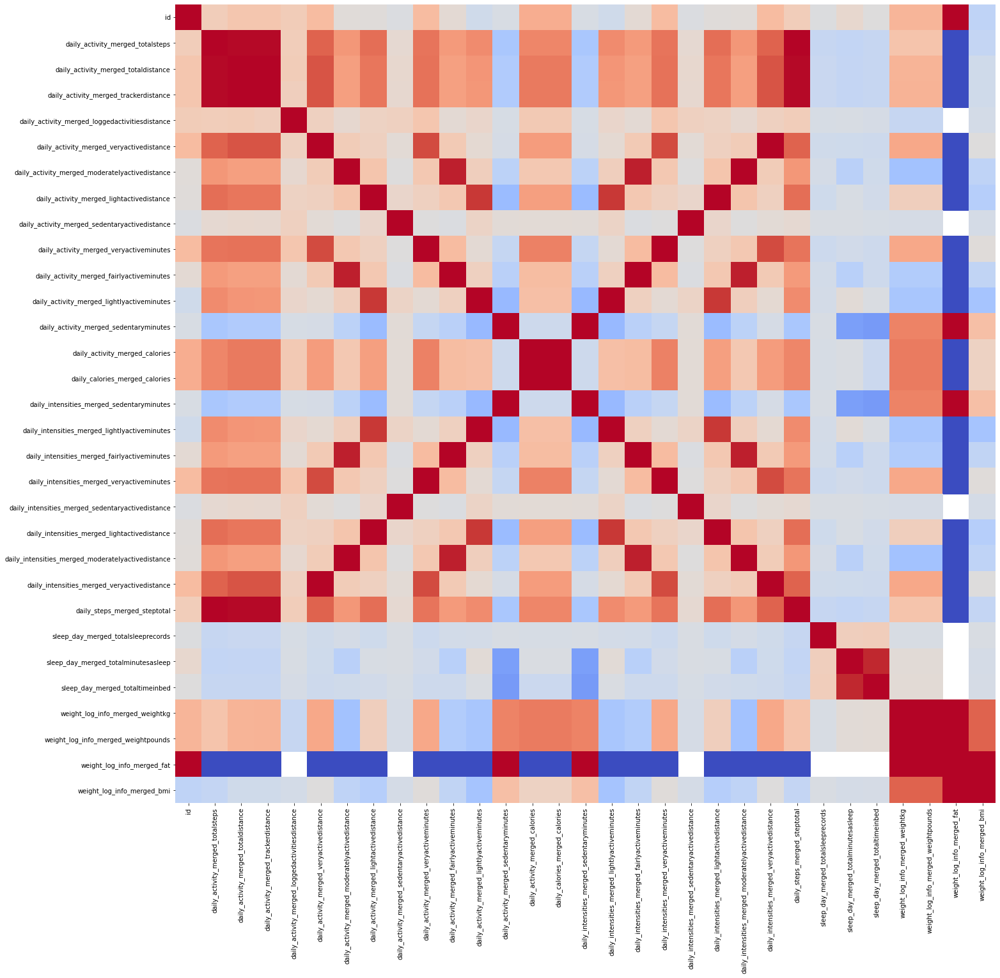

In [136]:
#get correlations of each features in dataset
plt.figure(figsize=(23,23))
plt.xlabel('xlabel', fontsize=20)
plt.ylabel('ylabel', fontsize=20)
sns.heatmap(fitbit_daily.corr(), cmap="coolwarm", cbar=False, vmin=-1, vmax=1)

In [137]:
corelation = fitbit_daily.corr()

<AxesSubplot:>

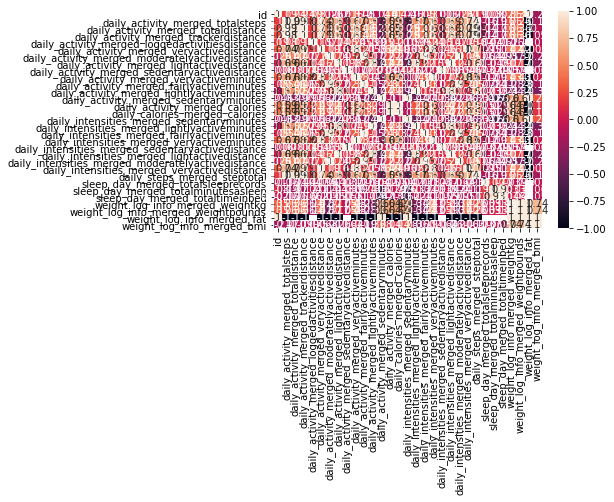

In [138]:
sns.heatmap(corelation, xticklabels=corelation.columns,yticklabels=corelation.columns,annot=True)

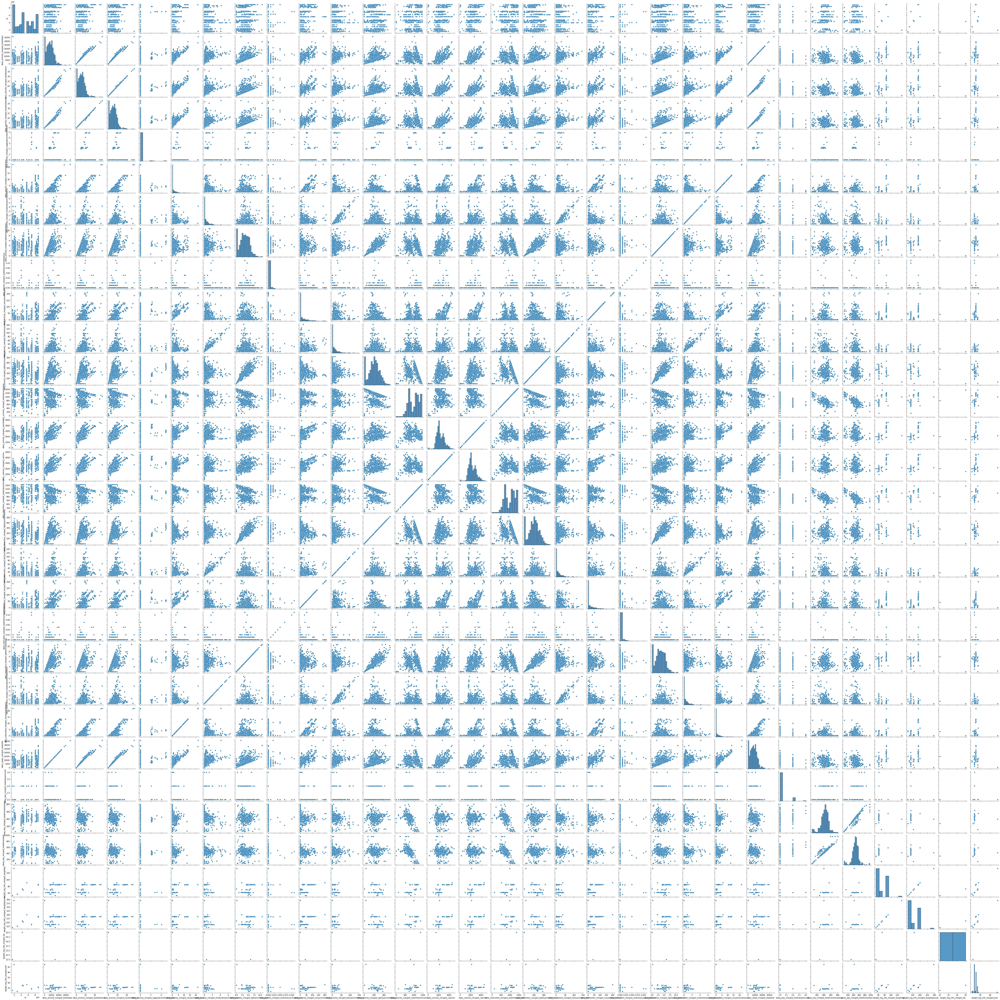

In [139]:
sns.pairplot(fitbit_daily)

C:\Users\rene_\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:185: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


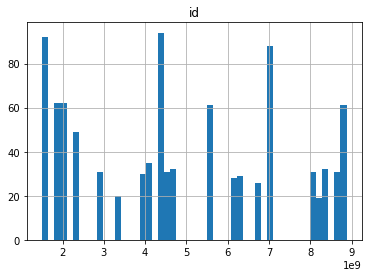

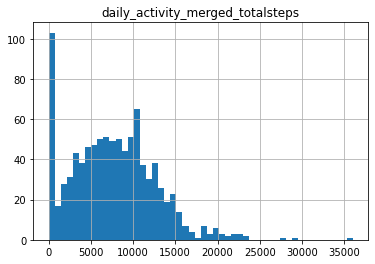

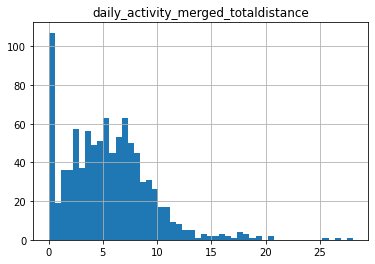

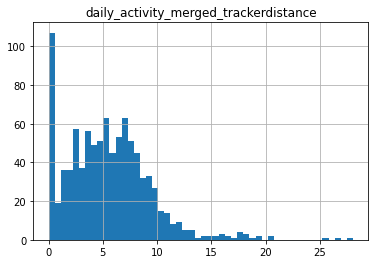

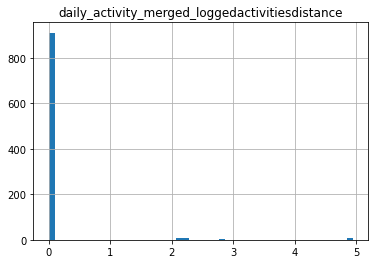

...

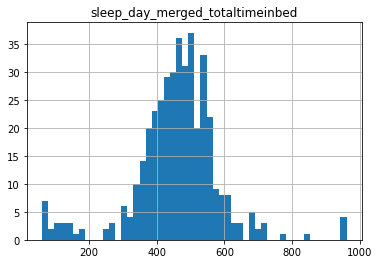

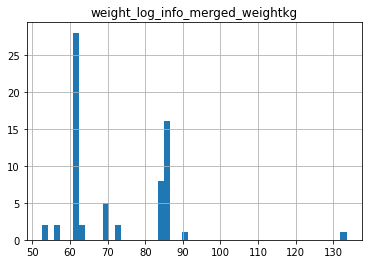

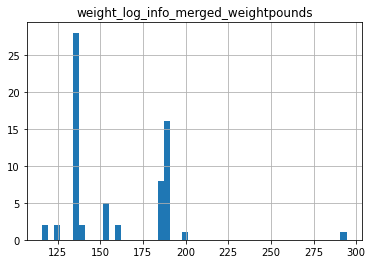

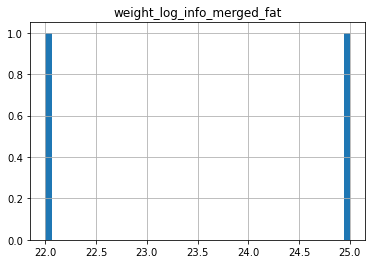

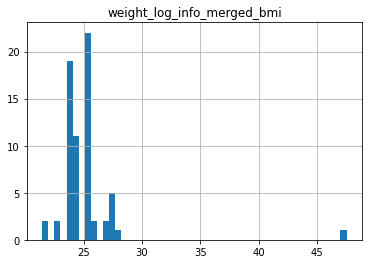

In [141]:
#Changed value os coluns
for value_column in fitbit_daily.columns:
    if value_column != 'time':
        fitbit_daily.hist(column=value_column,bins = 50)
        plt.show
    


### 06.02 - Fitbit Datetime

In [221]:
fitbit_datetime.head()

,id,time,heart_rate_value,calories,totalintensity,averageintensity,steptotal,calories_narrow,calories_wide_00,calories_wide_01,...,intensity_narrow,intensity_wide_00,intensity_wide_01,intensity_wide_02,mets,minute_sleep_value,steps_narrow,steps_wide_00,steps_wide_01,steps_wide_02
0,2022484408,2016-04-12 07:21:00,97.0,NaN,NaN,NaN,NaN,3.3206,NaN,NaN,...,1.0,NaN,NaN,NaN,32.0,NaN,17.0,NaN,NaN,NaN
1,2022484408,2016-04-12 07:21:05,102.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2022484408,2016-04-12 07:21:10,105.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2022484408,2016-04-12 07:21:20,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2022484408,2016-04-12 07:21:25,101.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [222]:
fitbit_datetime.describe()

,id,heart_rate_value,calories,totalintensity,averageintensity,steptotal,calories_narrow,calories_wide_00,calories_wide_01,calories_wide_02,intensity_narrow,intensity_wide_00,intensity_wide_01,intensity_wide_02,mets,minute_sleep_value,steps_narrow,steps_wide_00,steps_wide_01,steps_wide_02
count,3.654061e+06,2.483658e+06,22108.000000,22108.000000,22108.000000,22108.000000,1.326123e+06,21654.000000,21654.000000,21654.000000,1.326123e+06,21654.000000,21654.000000,21654.000000,1.326123e+06,188521.000000,1.326123e+06,21654.000000,21654.000000,21654.000000
mean,5.266476e+09,7.732842e+01,97.383662,12.031120,0.200519,320.050208,1.623046e+00,1.622538,1.626285,1.637740,2.005123e-01,0.199640,0.203242,0.208091,1.468814e+01,1.095793,5.334013e+00,5.302161,5.333195,5.529140
std,2.166513e+09,1.940450e+01,60.691073,21.130028,0.352167,690.270384,1.410166e+00,1.398135,1.394800,1.408543,5.189327e-01,0.509729,0.515341,0.521303,1.205330e+01,0.328673,1.812491e+01,17.779963,17.675018,18.076385
min,1.503960e+09,3.600000e+01,42.000000,0.000000,0.000000,0.000000,0.000000e+00,0.702700,0.702700,0.702700,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,1.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,4.020333e+09,6.300000e+01,63.000000,0.000000,0.000000,0.000000,9.357000e-01,0.935700,0.935700,0.937700,0.000000e+00,0.000000,0.000000,0.000000,1.000000e+01,1.000000,0.000000e+00,0.000000,0.000000,0.000000
50%,5.553957e+09,7.300000e+01,83.000000,3.000000,0.050000,40.000000,1.217600e+00,1.217600,1.218500,1.220400,0.000000e+00,0.000000,0.000000,0.000000,1.000000e+01,1.000000,0.000000e+00,0.000000,0.000000,0.000000
75%,6.962181e+09,8.800000e+01,108.000000,16.000000,0.266700,357.000000,1.432700e+00,1.432700,1.432700,1.432700,0.000000e+00,0.000000,0.000000,0.000000,1.100000e+01,1.000000,0.000000e+00,0.000000,0.000000,0.000000
max,8.877689e+09,2.030000e+02,948.000000,180.000000,3.000000,10554.000000,1.974990e+01,19.727300,19.727300,19.727300,3.000000e+00,3.000000,3.000000,3.000000,1.570000e+02,3.000000,2.200000e+02,186.000000,180.000000,182.000000


In [223]:
fitbit_datetime.nunique()

id                        33
time                  962131
heart_rate_value         168
calories                 442
totalintensity           175
averageintensity         175
steptotal               2222
calories_narrow         3899
calories_wide_00        1257
calories_wide_01        1230
calories_wide_02        1255
intensity_narrow           4
intensity_wide_00          4
intensity_wide_01          4
intensity_wide_02          4
mets                     136
minute_sleep_value         3
steps_narrow             193
steps_wide_00            158
steps_wide_01            153
steps_wide_02            156
dtype: int64

<AxesSubplot:>

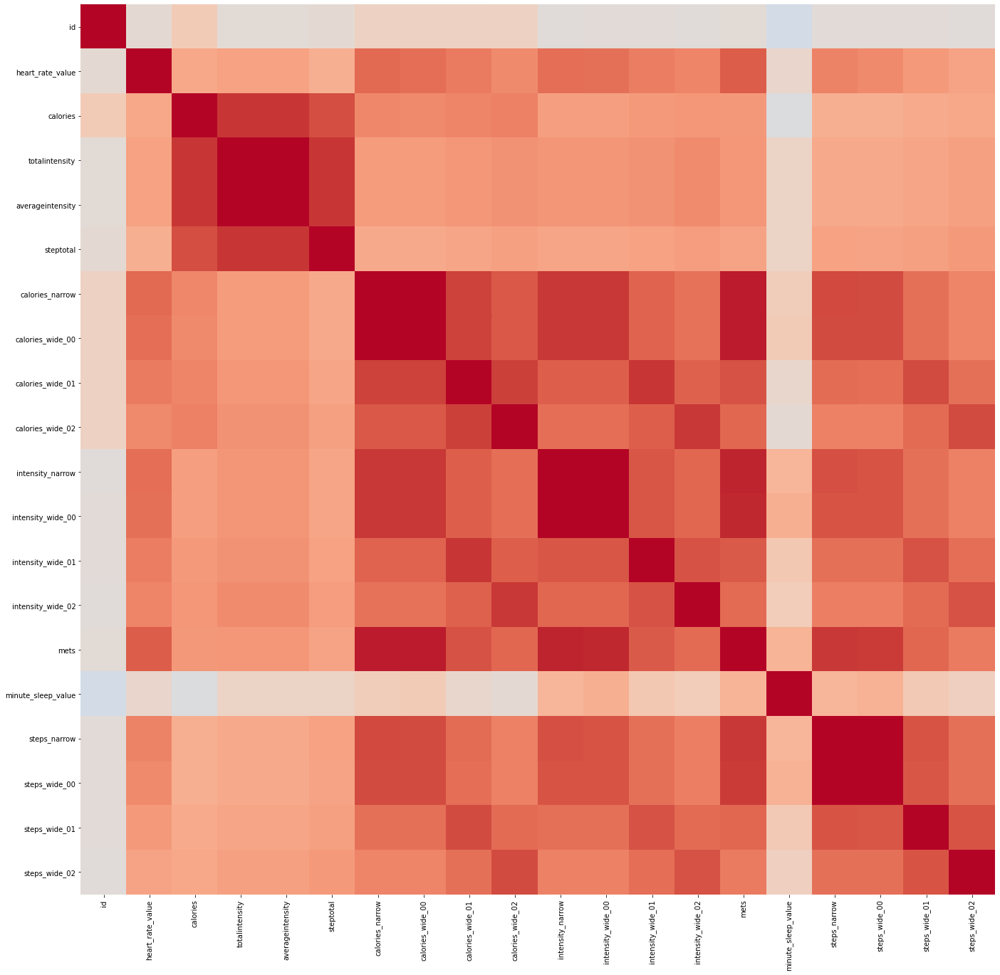

In [224]:
#get correlations of each features in dataset
plt.figure(figsize=(23,23))
plt.xlabel('xlabel', fontsize=20)
plt.ylabel('ylabel', fontsize=20)
sns.heatmap(fitbit_datetime.corr(), cmap="coolwarm", cbar=False, vmin=-1, vmax=1)

In [225]:
corelation = fitbit_datetime.corr()

<AxesSubplot:>

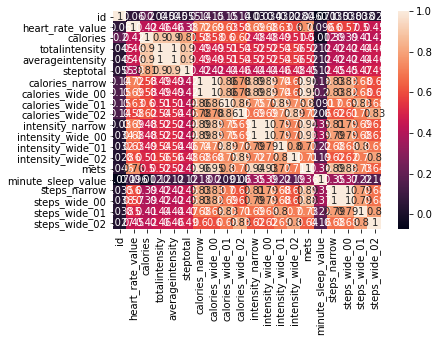

In [226]:
sns.heatmap(corelation, xticklabels=corelation.columns,yticklabels=corelation.columns,annot=True)

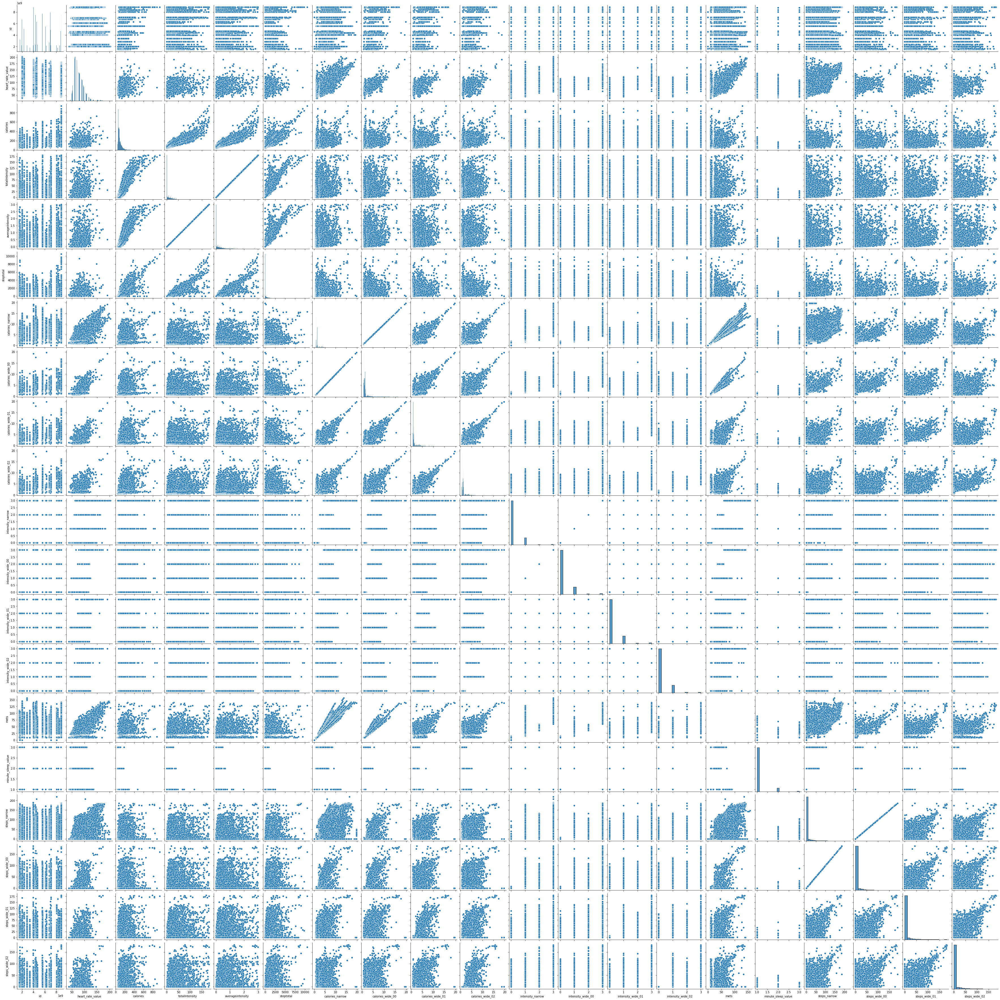

In [227]:
sns.pairplot(fitbit_datetime)

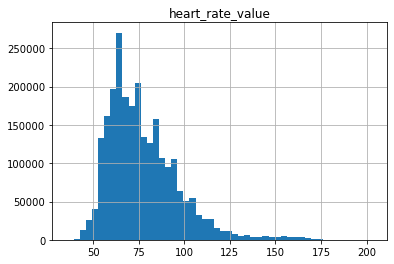

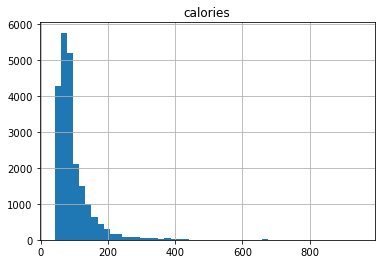

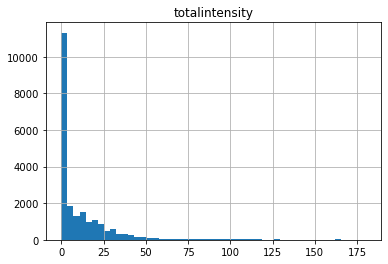

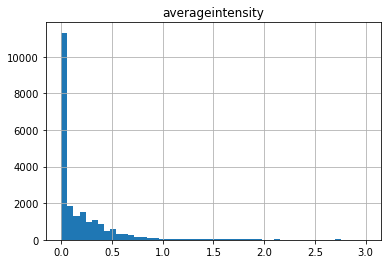

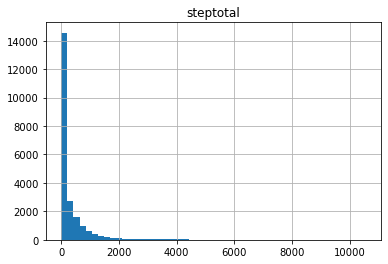

...

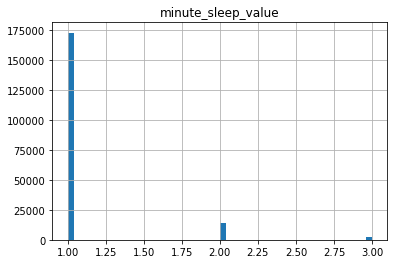

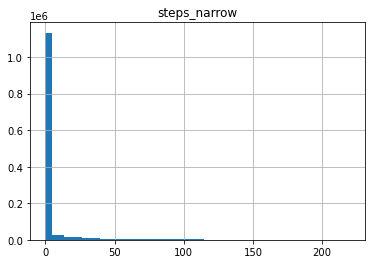

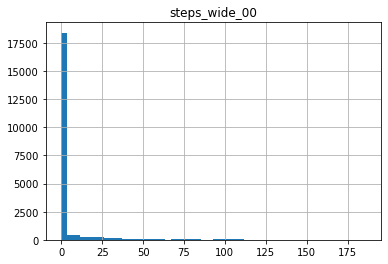

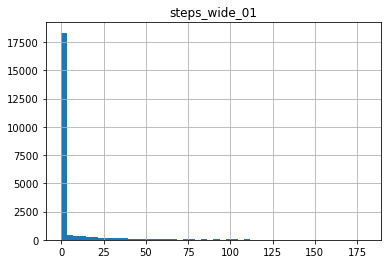

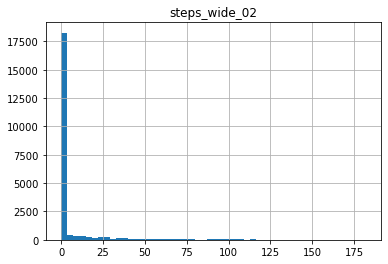

In [230]:
#Changed value os coluns
for value_column in ['heart_rate_value', 'calories', 'totalintensity',
       'averageintensity', 'steptotal', 'calories_narrow', 'calories_wide_00',
       'calories_wide_01', 'calories_wide_02', 'intensity_narrow',
       'intensity_wide_00', 'intensity_wide_01', 'intensity_wide_02', 'mets',
       'minute_sleep_value', 'steps_narrow', 'steps_wide_00', 'steps_wide_01',
       'steps_wide_02']:
    fitbit_datetime.hist(column=value_column,bins = 50)
    plt.show
    


## 07-Feature Selection

In [4]:
from sklearn.model_selection import KFold
from sklearn.metrics import log_loss
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import chi2
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

### 07.01 - Union Fitbit dataset

In [7]:
##Read datasets datetime and daily

In [6]:
fitbit_datetime = pd.read_parquet("fitbit_datetime.parquet", engine='pyarrow')
gc.collect()

6

In [7]:
fitbit_daily = pd.read_parquet("fitbit_daily.parquet", engine='pyarrow')
gc.collect()

20

In [4]:
##Created a day column to join datasets datetime and daily

In [8]:
fitbit_datetime['day'] = fitbit_datetime['time'].dt.strftime('%y-%m-%d')

In [146]:
fitbit_daily['day'] = fitbit_daily['time'].dt.strftime('%y-%m-%d')

In [6]:
##Replace null value to zero

In [147]:
fitbit_datetime.replace(np.nan, 0)

,id,time,heart_rate_value,calories,totalintensity,averageintensity,steptotal,calories_narrow,calories_wide_00,calories_wide_01,...,intensity_wide_00,intensity_wide_01,intensity_wide_02,mets,minute_sleep_value,steps_narrow,steps_wide_00,steps_wide_01,steps_wide_02,day
0,2022484408,2016-04-12 07:21:00,97.0,0.0,0.0,0.0,0.0,3.3206,0.0,0.0,...,0.0,0.0,0.0,32.0,0.0,17.0,0.0,0.0,0.0,16-04-12
1,2022484408,2016-04-12 07:21:05,102.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16-04-12
2,2022484408,2016-04-12 07:21:10,105.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16-04-12
3,2022484408,2016-04-12 07:21:20,103.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16-04-12
4,2022484408,2016-04-12 07:21:25,101.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16-04-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3654056,8792009665,2016-05-03 10:51:30,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,16-05-03
3654057,8792009665,2016-05-03 10:52:30,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,16-05-03
3654058,8792009665,2016-05-03 10:53:30,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,16-05-03
3654059,8792009665,2016-05-03 10:54:30,0.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,16-05-03


In [148]:
fitbit_daily.replace(np.nan, 0)

,id,time,daily_activity_merged_totalsteps,daily_activity_merged_totaldistance,daily_activity_merged_trackerdistance,daily_activity_merged_loggedactivitiesdistance,daily_activity_merged_veryactivedistance,daily_activity_merged_moderatelyactivedistance,daily_activity_merged_lightactivedistance,daily_activity_merged_sedentaryactivedistance,...,daily_intensities_merged_veryactivedistance,daily_steps_merged_steptotal,sleep_day_merged_totalsleeprecords,sleep_day_merged_totalminutesasleep,sleep_day_merged_totaltimeinbed,weight_log_info_merged_weightkg,weight_log_info_merged_weightpounds,weight_log_info_merged_fat,weight_log_info_merged_bmi,day
0,1503960366,2016-04-12,13162.0,8.50,8.50,0.0,1.88,0.55,6.06,0.00,...,1.88,13162.0,1.0,327.0,346.0,0.0,0.0000,0.0,0.00,16-04-12
1,1503960366,2016-04-13,10735.0,6.97,6.97,0.0,1.57,0.69,4.71,0.00,...,1.57,10735.0,2.0,384.0,407.0,0.0,0.0000,0.0,0.00,16-04-13
2,1503960366,2016-04-14,10460.0,6.74,6.74,0.0,2.44,0.40,3.91,0.00,...,2.44,10460.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.00,16-04-14
3,1503960366,2016-04-15,9762.0,6.28,6.28,0.0,2.14,1.26,2.83,0.00,...,2.14,9762.0,1.0,412.0,442.0,0.0,0.0000,0.0,0.00,16-04-15
4,1503960366,2016-04-16,12669.0,8.16,8.16,0.0,2.71,0.41,5.04,0.00,...,2.71,12669.0,2.0,340.0,367.0,0.0,0.0000,0.0,0.00,16-04-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
939,8877689391,2016-05-09,20226.0,18.25,18.25,0.0,11.10,0.80,6.24,0.05,...,11.10,20226.0,0.0,0.0,0.0,85.5,188.4952,0.0,25.61,16-05-09
940,8877689391,2016-05-10,10733.0,8.15,8.15,0.0,1.35,0.46,6.28,0.00,...,1.35,10733.0,0.0,0.0,0.0,0.0,0.0000,0.0,0.00,16-05-10
941,8877689391,2016-05-11,21420.0,19.56,19.56,0.0,13.22,0.41,5.89,0.00,...,13.22,21420.0,0.0,0.0,0.0,85.4,188.2748,0.0,25.56,16-05-11
942,8877689391,2016-05-12,8064.0,6.12,6.12,0.0,1.82,0.04,4.25,0.00,...,1.82,8064.0,0.0,0.0,0.0,85.8,189.1566,0.0,25.68,16-05-12


In [9]:
##Merge datasets with new day column

In [149]:
gc.collect()
fitbit = pd.merge(fitbit_datetime, fitbit_daily, on=['id', 'day'], how='left')
gc.collect()

12

In [15]:
fitbit.shape

(2494966, 52)

In [16]:
##Export merged dataset in parquet file

In [160]:
fitbit.to_parquet("fitbit.parquet")

### 07.02 - Clean Fitbit dataset

In [9]:
fitbit = pd.read_parquet("fitbit.parquet", engine='pyarrow')

In [13]:
##Delete columns there was little bit data

In [12]:
fitbit.drop(['weight_log_info_merged_fat'], axis='columns', inplace=True)

20

In [20]:
fitbit.drop(['time_y'], axis='columns', inplace=True)

In [21]:
fitbit.drop(['day'], axis='columns', inplace=True)

In [15]:
##Delete rows there was zero value in our target

In [13]:
fitbit.drop(fitbit[fitbit['heart_rate_value'] == 0].index, inplace=True)

In [14]:
fitbit.nunique()

id                                                       14
time_x                                               961274
heart_rate_value                                        168
calories                                                317
totalintensity                                          145
averageintensity                                        145
steptotal                                              1194
calories_narrow                                        2344
calories_wide_00                                        536
calories_wide_01                                        534
calories_wide_02                                        546
intensity_narrow                                          4
intensity_wide_00                                         4
intensity_wide_01                                         4
intensity_wide_02                                         4
mets                                                    126
minute_sleep_value                      

In [17]:
##Export cleaned dataset in parquet file

In [24]:
fitbit.to_parquet("fitbit.parquet")

### 07.03 - Starting Feature Selection

In [3]:
fitbit = pd.read_parquet("fitbit.parquet", engine='pyarrow')
gc.collect()

6

In [20]:
##Selected X and Y data

In [4]:
gc.collect()
X = fitbit.values[:,3:49]
Y = fitbit.values[:,2]
gc.collect()

0

In [19]:
##Divide data in Train & Test

In [5]:
gc.collect()
X_train, X_test, y_train, y_test = train_test_split(X, Y, 
                                                    test_size=0.33, 
                                                    random_state=42)
gc.collect()

0

#### Using Extra Trees Feature Selection

In [5]:
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import ExtraTreesRegressor

In [21]:
##Declare Model ExtraTreeRegressor

In [7]:
modelo = ExtraTreesRegressor()

In [22]:
##Execute Model

In [8]:
gc.collect()
modelo.fit(X, Y)
gc.collect()

24

In [23]:
## List of features with itself level of importance

In [12]:
importancias = pd.DataFrame({'Feature_names':fitbit.iloc[:,3:49].columns,'Importancias':modelo.feature_importances_})

In [13]:
importancias['Importancias'] = round(importancias['Importancias'],5)

In [14]:
pd.set_option('display.max_columns', 2)
pd.set_option('display.max_rows', 100)
importancias.sort_values(by='Importancias',ascending=False)

,Feature_names,Importancias
43,sleep_day_merged_totaltimeinbed,0.11128
42,sleep_day_merged_totalminutesasleep,0.09121
33,daily_intensities_merged_lightlyactiveminutes,0.07354
28,daily_activity_merged_lightlyactiveminutes,0.07133
12,mets,0.05478
30,daily_activity_merged_calories,0.03973
26,daily_activity_merged_veryactiveminutes,0.03792
31,daily_calories_merged_calories,0.03684
4,calories_narrow,0.03568
35,daily_intensities_merged_veryactiveminutes,0.03268


#### Using Recursive Feature Elimination (RFE)

In [6]:
from sklearn.feature_selection import RFE

In [21]:
##Declare Model ExtraTreeRegressor

In [10]:
rfe = RFE(estimator= clf_lr , step = 1) 

In [22]:
##Execute Model

In [11]:
fit = rfe.fit(X_train, y_train)

In [24]:
## List of features with itself level of importance

In [12]:
pd.set_option('display.max_columns', 2)
pd.set_option('display.max_rows', 100)
selected_rfe_features = pd.DataFrame({'Feature':list(fitbit.iloc[:,3:49].columns),
                                      'Ranking':rfe.ranking_})
selected_rfe_features.sort_values(by='Ranking')

,Feature,Ranking
22,daily_activity_merged_veryactivedistance,1
24,daily_activity_merged_lightactivedistance,1
25,daily_activity_merged_sedentaryactivedistance,1
26,daily_activity_merged_veryactiveminutes,1
27,daily_activity_merged_fairlyactiveminutes,1
28,daily_activity_merged_lightlyactiveminutes,1
29,daily_activity_merged_sedentaryminutes,1
30,daily_activity_merged_calories,1
23,daily_activity_merged_moderatelyactivedistance,1
31,daily_calories_merged_calories,1


#### Random Forest Regressor (Baseline Model)

In [7]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor

In [25]:
##Declare Model Random Forest

In [7]:
rf_clf = RandomForestRegressor(n_estimators = 100, max_features = 'auto', max_depth = 10, bootstrap = False, random_state = 42, verbose = 100)

In [22]:
##Execute Model

In [8]:
gc.collect()
rf_clf.fit(X_train, y_train)
gc.collect()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
building tree 1 of 100
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   21.3s remaining:    0.0s
building tree 2 of 100
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   42.0s remaining:    0.0s
building tree 3 of 100
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  1.0min remaining:    0.0s
building tree 4 of 100
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  1.4min remaining:    0.0s
building tree 5 of 100
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.7min remaining:    0.0s
building tree 6 of 100
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  2.1min remaining:    0.0s
building tree 7 of 100
[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  2.4min remaining:    0.0s
building tree 8 of 100
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  2.8min remaining:    0.0s
building tree 9 of 100
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  3.1min remaining: 

[Parallel(n_jobs=1)]: Done  79 out of  79 | elapsed: 27.4min remaining:    0.0s
building tree 80 of 100
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed: 27.7min remaining:    0.0s
building tree 81 of 100
[Parallel(n_jobs=1)]: Done  81 out of  81 | elapsed: 28.1min remaining:    0.0s
building tree 82 of 100
[Parallel(n_jobs=1)]: Done  82 out of  82 | elapsed: 28.4min remaining:    0.0s
building tree 83 of 100
[Parallel(n_jobs=1)]: Done  83 out of  83 | elapsed: 28.8min remaining:    0.0s
building tree 84 of 100
[Parallel(n_jobs=1)]: Done  84 out of  84 | elapsed: 29.1min remaining:    0.0s
building tree 85 of 100
[Parallel(n_jobs=1)]: Done  85 out of  85 | elapsed: 29.5min remaining:    0.0s
building tree 86 of 100
[Parallel(n_jobs=1)]: Done  86 out of  86 | elapsed: 29.8min remaining:    0.0s
building tree 87 of 100
[Parallel(n_jobs=1)]: Done  87 out of  87 | elapsed: 30.2min remaining:    0.0s
building tree 88 of 100
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed: 30.5min rem

24

In [24]:
## List of features with itself level of importance

In [9]:
feat_importances = pd.Series(rf_clf.feature_importances_, index=fitbit.iloc[:,3:49].columns)

In [10]:
pd.set_option('display.max_columns', 2)
pd.set_option('display.max_rows', 100)
selected_random_features = pd.DataFrame({'Feature':list(fitbit.iloc[:,3:49].columns),
                                      'Ranking':np.round(rf_clf.feature_importances_,4)})
selected_random_features.sort_values(by='Ranking', ascending=False)

,Feature,Ranking
43,sleep_day_merged_totaltimeinbed,0.1490
42,sleep_day_merged_totalminutesasleep,0.1340
33,daily_intensities_merged_lightlyactiveminutes,0.0798
12,mets,0.0680
28,daily_activity_merged_lightlyactiveminutes,0.0630
26,daily_activity_merged_veryactiveminutes,0.0493
31,daily_calories_merged_calories,0.0452
35,daily_intensities_merged_veryactiveminutes,0.0448
30,daily_activity_merged_calories,0.0421
44,weight_log_info_merged_weightkg,0.0379


### 07.04 - Compare each model results 

In [4]:
feature_selection = pd.read_csv('/Users/rene_/01-Python/Pos/TCC/fitbit/feature_selection.csv')  

In [26]:
## List of models measures

In [5]:
pd.set_option('display.max_columns', 10)
pd.set_option('display.max_rows', 100)
feature_selection.describe()

,ExtraTree,RFE,RandomForest,AVG_Ranking
count,46.000000,46.000000,46.000000,46.000000
mean,0.021739,0.056035,0.021739,0.033171
std,0.025087,0.045119,0.033162,0.025153
min,0.000010,0.004167,0.000000,0.001406
25%,0.000050,0.007853,0.000000,0.006914
50%,0.012785,0.075000,0.007700,0.035798
75%,0.029775,0.100000,0.032175,0.050137
max,0.111280,0.100000,0.149000,0.088209


In [27]:
## Sort Results by Average Result

In [6]:
feature_selection
pd.set_option('display.max_columns', 10)
pd.set_option('display.max_rows', 100)
feature_selection.sort_values(by='AVG_Ranking', ascending=False)

,Feature_names,ExtraTree,RFE,RandomForest,AVG_Ranking
0,sleep_day_merged_totaltimeinbed,0.11128,0.004348,0.1490,0.088209
2,daily_intensities_merged_lightlyactiveminutes,0.07354,0.100000,0.0798,0.084447
3,daily_activity_merged_lightlyactiveminutes,0.07133,0.100000,0.0630,0.078110
1,sleep_day_merged_totalminutesasleep,0.09121,0.004545,0.1340,0.076585
6,daily_activity_merged_veryactiveminutes,0.03792,0.100000,0.0493,0.062407
7,daily_calories_merged_calories,0.03684,0.100000,0.0452,0.060680
5,daily_activity_merged_calories,0.03973,0.100000,0.0421,0.060610
9,daily_intensities_merged_veryactiveminutes,0.03268,0.100000,0.0448,0.059160
18,weight_log_info_merged_weightkg,0.02441,0.100000,0.0379,0.054103
12,weight_log_info_merged_weightpounds,0.02943,0.100000,0.0326,0.054010


## 08-Start Create Model

In [8]:
from interpret import show
from interpret.data import ClassHistogram
from interpret.data import Marginal
from interpret.glassbox import ExplainableBoostingClassifier
from interpret.glassbox import ExplainableBoostingRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn import metrics   #Additional scklearn functions
from matplotlib.pylab import rcParams
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import TweedieRegressor
from sklearn.linear_model import PoissonRegressor
from sklearn.metrics import classification_report
import shap
import math
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [28]:
## Choice most important features

In [14]:
feature_selection = ['id','time_x','heart_rate_value','sleep_day_merged_totaltimeinbed', 'daily_intensities_merged_lightlyactiveminutes', 'daily_activity_merged_lightlyactiveminutes', 'sleep_day_merged_totalminutesasleep', 'daily_activity_merged_veryactiveminutes', 'daily_calories_merged_calories', 'daily_activity_merged_calories', 'daily_intensities_merged_veryactiveminutes', 'weight_log_info_merged_weightkg', 'weight_log_info_merged_weightpounds', 'daily_intensities_merged_lightactivedistance', 'daily_activity_merged_lightactivedistance', 'daily_intensities_merged_sedentaryminutes', 'daily_intensities_merged_veryactivedistance', 'daily_activity_merged_veryactivedistance', 'daily_activity_merged_sedentaryminutes', 'mets', 'daily_activity_merged_totalsteps', 'daily_activity_merged_moderatelyactivedistance', 'daily_steps_merged_steptotal', 'daily_intensities_merged_moderatelyactivedistance', 'daily_activity_merged_fairlyactiveminutes', 'daily_intensities_merged_sedentaryactivedistance', 'daily_activity_merged_sedentaryactivedistance', 'averageintensity', 'totalintensity', 'minute_sleep_value', 'intensity_narrow', 'calories_narrow', 'daily_intensities_merged_fairlyactiveminutes']

In [30]:
## Load dataset only with most important features

In [16]:
gc.collect()
fitbit_feature_selection = pd.read_parquet("fitbit.parquet", engine='pyarrow', columns=feature_selection)
gc.collect()

0

In [31]:
##Export feature selection dataset in parquet file

In [20]:
fitbit_feature_selection.to_parquet("fitbit_feature_selection.parquet")

### 08.01 - Starting Model Train with Full Dataset

#### Explainable Boosting Machine (EBM)
https://medium.com/analytics-vidhya/model-interpretation-with-microsofts-interpret-ml-85aa0ad697ae

In [20]:
##Selected X and Y data

In [26]:
X = fitbit_feature_selection.values[:,3:33]
Y = fitbit_feature_selection.values[:,2]
gc.collect()

0

In [32]:
##Split data in Train & Test

In [27]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, 
                                                    test_size=0.33, 
                                                    random_state=42)
gc.collect()

20

In [33]:
##Declare Model

In [28]:
ebm = ExplainableBoostingRegressor(feature_names=fitbit_feature_selection.iloc[:, 3:33].columns, random_state=42)

In [22]:
##Execute Model

In [29]:
gc.collect()
ebm.fit(X_train, Y_train)
gc.collect()

0

In [34]:
##Use model to predict X_test

In [30]:
gc.collect()
ebm_pred = ebm.predict(X_test)
gc.collect()

360

In [35]:
##Calculate Model Score

In [31]:
ebm.score(X_test,Y_test)

0.26683847706772756

In [36]:
##Show Features Importances's Model

In [32]:
ebm_plot = ebm.explain_global(name='EBM FEATURE IMPORTANCE')
show(ebm_plot)

<!-- http://127.0.0.1:7001/1902064014192/ -->

#### Catboost
https://www.youtube.com/watch?v=W9iktBS67Iw

In [32]:
##Split data in Train & Test

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(df_pp_freq.values[:,0:32], 
                                                    df_pp_freq.values[:,32], 
                                                    test_size=0.33, 
                                                    random_state=42)
gc.collect()

In [33]:
##Declare Model

In [33]:
cat = CatBoostRegressor(loss_function='RMSE')

In [22]:
##Execute Model

In [34]:
gc.collect()
cat.fit(X_train, Y_train)
gc.collect()

Learning rate set to 0.146258
0:	learn: 18.9792740	total: 451ms	remaining: 7m 30s
1:	learn: 18.6510833	total: 757ms	remaining: 6m 17s
2:	learn: 18.3936256	total: 1.03s	remaining: 5m 42s
3:	learn: 18.1862508	total: 1.35s	remaining: 5m 35s
4:	learn: 18.0200015	total: 1.62s	remaining: 5m 21s
5:	learn: 17.8755067	total: 1.95s	remaining: 5m 23s
6:	learn: 17.7715045	total: 2.21s	remaining: 5m 13s
7:	learn: 17.6745787	total: 2.5s	remaining: 5m 9s
8:	learn: 17.6028580	total: 2.74s	remaining: 5m 2s
9:	learn: 17.5242465	total: 3.06s	remaining: 5m 2s
10:	learn: 17.4684185	total: 3.28s	remaining: 4m 54s
11:	learn: 17.4210449	total: 3.56s	remaining: 4m 52s
12:	learn: 17.3760270	total: 3.81s	remaining: 4m 48s
13:	learn: 17.3244033	total: 4.11s	remaining: 4m 49s
14:	learn: 17.2883862	total: 4.38s	remaining: 4m 47s
15:	learn: 17.2580549	total: 4.63s	remaining: 4m 44s
16:	learn: 17.2292143	total: 4.89s	remaining: 4m 43s
17:	learn: 17.2038292	total: 5.14s	remaining: 4m 40s
18:	learn: 17.1749454	total: 5

155:	learn: 16.6020581	total: 43.7s	remaining: 3m 56s
156:	learn: 16.6014444	total: 43.9s	remaining: 3m 55s
157:	learn: 16.6006836	total: 44.2s	remaining: 3m 55s
158:	learn: 16.6001847	total: 44.5s	remaining: 3m 55s
159:	learn: 16.5996651	total: 44.7s	remaining: 3m 54s
160:	learn: 16.5994272	total: 45s	remaining: 3m 54s
161:	learn: 16.5989876	total: 45.3s	remaining: 3m 54s
162:	learn: 16.5982239	total: 45.6s	remaining: 3m 54s
163:	learn: 16.5978596	total: 45.9s	remaining: 3m 53s
164:	learn: 16.5974553	total: 46.2s	remaining: 3m 53s
165:	learn: 16.5971559	total: 46.4s	remaining: 3m 53s
166:	learn: 16.5968539	total: 46.7s	remaining: 3m 52s
167:	learn: 16.5965107	total: 46.9s	remaining: 3m 52s
168:	learn: 16.5962688	total: 47.1s	remaining: 3m 51s
169:	learn: 16.5958346	total: 47.4s	remaining: 3m 51s
170:	learn: 16.5953026	total: 47.6s	remaining: 3m 50s
171:	learn: 16.5948034	total: 48s	remaining: 3m 50s
172:	learn: 16.5943276	total: 48.2s	remaining: 3m 50s
173:	learn: 16.5937789	total: 48

307:	learn: 16.5700817	total: 1m 22s	remaining: 3m 6s
308:	learn: 16.5700493	total: 1m 23s	remaining: 3m 5s
309:	learn: 16.5699431	total: 1m 23s	remaining: 3m 5s
310:	learn: 16.5699051	total: 1m 23s	remaining: 3m 5s
311:	learn: 16.5698326	total: 1m 23s	remaining: 3m 4s
312:	learn: 16.5697803	total: 1m 24s	remaining: 3m 4s
313:	learn: 16.5697131	total: 1m 24s	remaining: 3m 4s
314:	learn: 16.5696696	total: 1m 24s	remaining: 3m 3s
315:	learn: 16.5695830	total: 1m 24s	remaining: 3m 3s
316:	learn: 16.5694812	total: 1m 25s	remaining: 3m 3s
317:	learn: 16.5693768	total: 1m 25s	remaining: 3m 2s
318:	learn: 16.5693193	total: 1m 25s	remaining: 3m 2s
319:	learn: 16.5692421	total: 1m 25s	remaining: 3m 2s
320:	learn: 16.5691247	total: 1m 26s	remaining: 3m 1s
321:	learn: 16.5690274	total: 1m 26s	remaining: 3m 1s
322:	learn: 16.5689691	total: 1m 26s	remaining: 3m 1s
323:	learn: 16.5689215	total: 1m 26s	remaining: 3m 1s
324:	learn: 16.5688457	total: 1m 27s	remaining: 3m
325:	learn: 16.5687393	total: 1

457:	learn: 16.5622360	total: 2m 1s	remaining: 2m 23s
458:	learn: 16.5622036	total: 2m 1s	remaining: 2m 23s
459:	learn: 16.5621664	total: 2m 1s	remaining: 2m 23s
460:	learn: 16.5621201	total: 2m 2s	remaining: 2m 22s
461:	learn: 16.5620989	total: 2m 2s	remaining: 2m 22s
462:	learn: 16.5620856	total: 2m 2s	remaining: 2m 22s
463:	learn: 16.5620608	total: 2m 2s	remaining: 2m 22s
464:	learn: 16.5620345	total: 2m 3s	remaining: 2m 21s
465:	learn: 16.5620150	total: 2m 3s	remaining: 2m 21s
466:	learn: 16.5619736	total: 2m 3s	remaining: 2m 21s
467:	learn: 16.5619430	total: 2m 4s	remaining: 2m 20s
468:	learn: 16.5619018	total: 2m 4s	remaining: 2m 20s
469:	learn: 16.5618728	total: 2m 4s	remaining: 2m 20s
470:	learn: 16.5618501	total: 2m 4s	remaining: 2m 20s
471:	learn: 16.5618004	total: 2m 4s	remaining: 2m 19s
472:	learn: 16.5617679	total: 2m 5s	remaining: 2m 19s
473:	learn: 16.5617373	total: 2m 5s	remaining: 2m 19s
474:	learn: 16.5617242	total: 2m 5s	remaining: 2m 18s
475:	learn: 16.5617156	total

608:	learn: 16.5588322	total: 2m 38s	remaining: 1m 41s
609:	learn: 16.5587985	total: 2m 38s	remaining: 1m 41s
610:	learn: 16.5587822	total: 2m 38s	remaining: 1m 41s
611:	learn: 16.5587663	total: 2m 39s	remaining: 1m 40s
612:	learn: 16.5587458	total: 2m 39s	remaining: 1m 40s
613:	learn: 16.5587336	total: 2m 39s	remaining: 1m 40s
614:	learn: 16.5587260	total: 2m 39s	remaining: 1m 40s
615:	learn: 16.5587127	total: 2m 40s	remaining: 1m 39s
616:	learn: 16.5586924	total: 2m 40s	remaining: 1m 39s
617:	learn: 16.5586788	total: 2m 40s	remaining: 1m 39s
618:	learn: 16.5586727	total: 2m 40s	remaining: 1m 38s
619:	learn: 16.5586584	total: 2m 41s	remaining: 1m 38s
620:	learn: 16.5586376	total: 2m 41s	remaining: 1m 38s
621:	learn: 16.5586145	total: 2m 41s	remaining: 1m 38s
622:	learn: 16.5585997	total: 2m 41s	remaining: 1m 37s
623:	learn: 16.5585697	total: 2m 42s	remaining: 1m 37s
624:	learn: 16.5585597	total: 2m 42s	remaining: 1m 37s
625:	learn: 16.5585516	total: 2m 42s	remaining: 1m 37s
626:	learn

759:	learn: 16.5567447	total: 3m 14s	remaining: 1m 1s
760:	learn: 16.5567368	total: 3m 14s	remaining: 1m 1s
761:	learn: 16.5567285	total: 3m 15s	remaining: 1m
762:	learn: 16.5567199	total: 3m 15s	remaining: 1m
763:	learn: 16.5567050	total: 3m 15s	remaining: 1m
764:	learn: 16.5566901	total: 3m 15s	remaining: 1m
765:	learn: 16.5566801	total: 3m 16s	remaining: 59.9s
766:	learn: 16.5566720	total: 3m 16s	remaining: 59.6s
767:	learn: 16.5566622	total: 3m 16s	remaining: 59.4s
768:	learn: 16.5566449	total: 3m 16s	remaining: 59.1s
769:	learn: 16.5566413	total: 3m 16s	remaining: 58.8s
770:	learn: 16.5566295	total: 3m 17s	remaining: 58.6s
771:	learn: 16.5566210	total: 3m 17s	remaining: 58.3s
772:	learn: 16.5566032	total: 3m 17s	remaining: 58.1s
773:	learn: 16.5565977	total: 3m 17s	remaining: 57.8s
774:	learn: 16.5565910	total: 3m 18s	remaining: 57.5s
775:	learn: 16.5565784	total: 3m 18s	remaining: 57.3s
776:	learn: 16.5565710	total: 3m 18s	remaining: 57s
777:	learn: 16.5565613	total: 3m 18s	remai

912:	learn: 16.5552929	total: 3m 51s	remaining: 22s
913:	learn: 16.5552852	total: 3m 51s	remaining: 21.8s
914:	learn: 16.5552784	total: 3m 51s	remaining: 21.5s
915:	learn: 16.5552667	total: 3m 52s	remaining: 21.3s
916:	learn: 16.5552563	total: 3m 52s	remaining: 21s
917:	learn: 16.5552532	total: 3m 52s	remaining: 20.8s
918:	learn: 16.5552484	total: 3m 52s	remaining: 20.5s
919:	learn: 16.5552432	total: 3m 53s	remaining: 20.3s
920:	learn: 16.5552352	total: 3m 53s	remaining: 20s
921:	learn: 16.5552293	total: 3m 53s	remaining: 19.8s
922:	learn: 16.5552240	total: 3m 53s	remaining: 19.5s
923:	learn: 16.5552170	total: 3m 53s	remaining: 19.2s
924:	learn: 16.5552140	total: 3m 54s	remaining: 19s
925:	learn: 16.5552061	total: 3m 54s	remaining: 18.7s
926:	learn: 16.5551951	total: 3m 54s	remaining: 18.5s
927:	learn: 16.5551900	total: 3m 54s	remaining: 18.2s
928:	learn: 16.5551793	total: 3m 55s	remaining: 18s
929:	learn: 16.5551740	total: 3m 55s	remaining: 17.7s
930:	learn: 16.5551729	total: 3m 55s	r

0

In [34]:
##Use model to predict X_test

In [35]:
gc.collect()
cat_pred = cat.predict(X_test)
gc.collect()

0

In [35]:
##Calculate Model Score

In [36]:
cat.score(X_test, Y_test)

0.27057675552343985

In [36]:
##Show Features Importances's Model

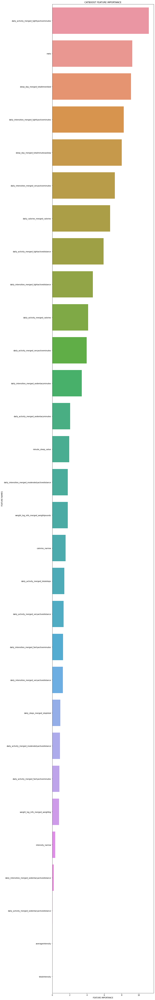

In [46]:
cat_plot = plot_feature_importance(cat.get_feature_importance(),fitbit_feature_selection.iloc[:, 3:33].columns,'CATBOOST ')

#### GBM

In [32]:
##Split data in Train & Test

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(df_pp_freq.values[:,0:32], 
                                                    df_pp_freq.values[:,32], 
                                                    test_size=0.33, 
                                                    random_state=42)
gc.collect()

In [33]:
##Declare Model

In [47]:
gbm = GradientBoostingRegressor(random_state=42)

In [22]:
##Execute Model

In [48]:
gc.collect()
gbm.fit(X_train, Y_train)
gc.collect()

0

In [34]:
##Use model to predict X_test

In [49]:
gbm_pred = gbm.predict(X_test)

In [35]:
##Calculate Model Score

In [50]:
gbm.score(X_test,Y_test)

0.23691916018173942

In [36]:
##Show Features Importances's Model

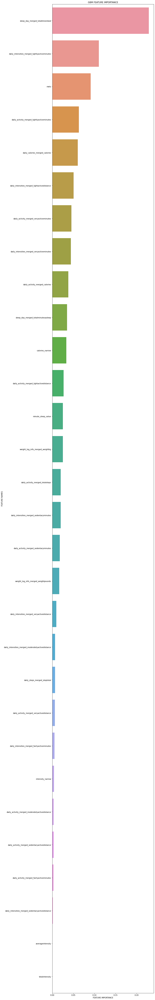

In [52]:
gbm_plot = plot_feature_importance(gbm.feature_importances_,fitbit_feature_selection.iloc[:, 3:33].columns,'GBM ')

### 08.02 - Starting Model Train with Downsizing One Feature
Choice one most important feature and delete zero values

In [37]:
## Load dataset

In [35]:
fitbit_feature_selection = pd.read_parquet("fitbit_feature_selection.parquet", engine='pyarrow')

In [38]:
##Delete rows there was zero value in sleep_day_merged_totaltimeinbed

In [36]:
gc.collect()
fitbit_downsizing_02 = fitbit_feature_selection.loc[fitbit_feature_selection['sleep_day_merged_totaltimeinbed']!= 0]
gc.collect()

18

In [37]:
fitbit_downsizing_02.shape

(1637137, 33)

In [39]:
##Export downsizing dataset in parquet file

In [38]:
fitbit_downsizing_02.to_parquet("fitbit_downsizing_02.parquet")

In [37]:
## Load dataset

In [ ]:
gc.collect()
fitbit_downsizing = pd.read_parquet("fitbit_downsizing_02.parquet", engine='pyarrow')
gc.collect()

In [32]:
##Split data in Train & Test

In [39]:
X_train, X_test, Y_train, Y_test = train_test_split(fitbit_downsizing_02.values[:,3:33], 
                                                    fitbit_downsizing_02.values[:,2], 
                                                    test_size=0.33, 
                                                    random_state=42)
gc.collect()

0

#### EBM

In [33]:
##Declare Model

In [40]:
ebm = ExplainableBoostingRegressor(feature_names=fitbit_downsizing_02.iloc[:, 3:33].columns, random_state=42)

In [22]:
##Execute Model

In [41]:
gc.collect()
ebm.fit(X_train, Y_train)
gc.collect()

0

In [34]:
##Use model to predict X_test

In [42]:
ebm_pred = ebm.predict(X_test)

In [35]:
##Calculate Model Score

In [43]:
ebm.score(X_test,Y_test)

0.23648218288288836

In [36]:
##Show Features Importances's Model

In [44]:
ebm_plot = ebm.explain_global(name='EBM FEATURE IMPORTANCE')
show(ebm_plot)

<!-- http://127.0.0.1:7001/2641472890240/ -->

#### Catboost

In [33]:
##Declare Model

In [47]:
cat = CatBoostRegressor(loss_function='RMSE')

In [22]:
##Execute Model

In [48]:
gc.collect()
cat.fit(X_train, Y_train)
gc.collect()

Learning rate set to 0.13569
0:	learn: 17.1039193	total: 179ms	remaining: 2m 58s
1:	learn: 16.8578712	total: 344ms	remaining: 2m 51s
2:	learn: 16.6601331	total: 553ms	remaining: 3m 3s
3:	learn: 16.4910160	total: 755ms	remaining: 3m 8s
4:	learn: 16.3634468	total: 957ms	remaining: 3m 10s
5:	learn: 16.2519006	total: 1.12s	remaining: 3m 6s
6:	learn: 16.1579282	total: 1.35s	remaining: 3m 11s
7:	learn: 16.0762333	total: 1.53s	remaining: 3m 9s
8:	learn: 16.0022637	total: 1.7s	remaining: 3m 7s
9:	learn: 15.9521748	total: 1.89s	remaining: 3m 7s
10:	learn: 15.8922867	total: 2.11s	remaining: 3m 9s
11:	learn: 15.8356400	total: 2.29s	remaining: 3m 8s
12:	learn: 15.7823042	total: 2.5s	remaining: 3m 9s
13:	learn: 15.7481939	total: 2.68s	remaining: 3m 8s
14:	learn: 15.7109702	total: 2.87s	remaining: 3m 8s
15:	learn: 15.6801995	total: 3.05s	remaining: 3m 7s
16:	learn: 15.6565835	total: 3.23s	remaining: 3m 6s
17:	learn: 15.6254211	total: 3.41s	remaining: 3m 5s
18:	learn: 15.6061030	total: 3.6s	remaining

156:	learn: 15.2018518	total: 29.1s	remaining: 2m 36s
157:	learn: 15.2014100	total: 29.5s	remaining: 2m 36s
158:	learn: 15.2012578	total: 29.6s	remaining: 2m 36s
159:	learn: 15.2008868	total: 29.8s	remaining: 2m 36s
160:	learn: 15.2006094	total: 30s	remaining: 2m 36s
161:	learn: 15.2001599	total: 30.2s	remaining: 2m 36s
162:	learn: 15.1999417	total: 30.3s	remaining: 2m 35s
163:	learn: 15.1997546	total: 30.5s	remaining: 2m 35s
164:	learn: 15.1993536	total: 30.7s	remaining: 2m 35s
165:	learn: 15.1991417	total: 30.8s	remaining: 2m 34s
166:	learn: 15.1987776	total: 31s	remaining: 2m 34s
167:	learn: 15.1984004	total: 31.2s	remaining: 2m 34s
168:	learn: 15.1982365	total: 31.3s	remaining: 2m 33s
169:	learn: 15.1979382	total: 31.5s	remaining: 2m 33s
170:	learn: 15.1977214	total: 31.7s	remaining: 2m 33s
171:	learn: 15.1974867	total: 31.9s	remaining: 2m 33s
172:	learn: 15.1972686	total: 32s	remaining: 2m 33s
173:	learn: 15.1971416	total: 32.2s	remaining: 2m 32s
174:	learn: 15.1969651	total: 32.3

311:	learn: 15.1829697	total: 54.9s	remaining: 2m
312:	learn: 15.1828725	total: 55s	remaining: 2m
313:	learn: 15.1828154	total: 55.2s	remaining: 2m
314:	learn: 15.1827730	total: 55.3s	remaining: 2m
315:	learn: 15.1827389	total: 55.4s	remaining: 2m
316:	learn: 15.1827000	total: 55.6s	remaining: 1m 59s
317:	learn: 15.1826503	total: 55.7s	remaining: 1m 59s
318:	learn: 15.1826211	total: 55.9s	remaining: 1m 59s
319:	learn: 15.1825840	total: 56s	remaining: 1m 59s
320:	learn: 15.1825386	total: 56.2s	remaining: 1m 58s
321:	learn: 15.1824819	total: 56.4s	remaining: 1m 58s
322:	learn: 15.1824409	total: 56.5s	remaining: 1m 58s
323:	learn: 15.1823977	total: 56.7s	remaining: 1m 58s
324:	learn: 15.1823626	total: 56.8s	remaining: 1m 58s
325:	learn: 15.1823268	total: 57s	remaining: 1m 57s
326:	learn: 15.1822691	total: 57.2s	remaining: 1m 57s
327:	learn: 15.1822503	total: 57.3s	remaining: 1m 57s
328:	learn: 15.1822048	total: 57.5s	remaining: 1m 57s
329:	learn: 15.1821312	total: 57.6s	remaining: 1m 57s


463:	learn: 15.1780574	total: 1m 18s	remaining: 1m 31s
464:	learn: 15.1780412	total: 1m 18s	remaining: 1m 30s
465:	learn: 15.1780272	total: 1m 19s	remaining: 1m 30s
466:	learn: 15.1780122	total: 1m 19s	remaining: 1m 30s
467:	learn: 15.1779923	total: 1m 19s	remaining: 1m 30s
468:	learn: 15.1779843	total: 1m 19s	remaining: 1m 30s
469:	learn: 15.1779504	total: 1m 19s	remaining: 1m 29s
470:	learn: 15.1779425	total: 1m 19s	remaining: 1m 29s
471:	learn: 15.1779257	total: 1m 19s	remaining: 1m 29s
472:	learn: 15.1779047	total: 1m 20s	remaining: 1m 29s
473:	learn: 15.1778777	total: 1m 20s	remaining: 1m 29s
474:	learn: 15.1778667	total: 1m 20s	remaining: 1m 28s
475:	learn: 15.1778539	total: 1m 20s	remaining: 1m 28s
476:	learn: 15.1778291	total: 1m 20s	remaining: 1m 28s
477:	learn: 15.1778185	total: 1m 20s	remaining: 1m 28s
478:	learn: 15.1777974	total: 1m 21s	remaining: 1m 28s
479:	learn: 15.1777722	total: 1m 21s	remaining: 1m 28s
480:	learn: 15.1777528	total: 1m 21s	remaining: 1m 27s
481:	learn

614:	learn: 15.1754997	total: 1m 42s	remaining: 1m 4s
615:	learn: 15.1754868	total: 1m 42s	remaining: 1m 3s
616:	learn: 15.1754814	total: 1m 42s	remaining: 1m 3s
617:	learn: 15.1754693	total: 1m 42s	remaining: 1m 3s
618:	learn: 15.1754651	total: 1m 42s	remaining: 1m 3s
619:	learn: 15.1754580	total: 1m 43s	remaining: 1m 3s
620:	learn: 15.1754409	total: 1m 43s	remaining: 1m 2s
621:	learn: 15.1754301	total: 1m 43s	remaining: 1m 2s
622:	learn: 15.1754257	total: 1m 43s	remaining: 1m 2s
623:	learn: 15.1754141	total: 1m 43s	remaining: 1m 2s
624:	learn: 15.1753980	total: 1m 43s	remaining: 1m 2s
625:	learn: 15.1753619	total: 1m 44s	remaining: 1m 2s
626:	learn: 15.1753464	total: 1m 44s	remaining: 1m 1s
627:	learn: 15.1753416	total: 1m 44s	remaining: 1m 1s
628:	learn: 15.1753311	total: 1m 44s	remaining: 1m 1s
629:	learn: 15.1753267	total: 1m 44s	remaining: 1m 1s
630:	learn: 15.1753201	total: 1m 44s	remaining: 1m 1s
631:	learn: 15.1752993	total: 1m 44s	remaining: 1m 1s
632:	learn: 15.1752933	total

769:	learn: 15.1738396	total: 2m 6s	remaining: 37.7s
770:	learn: 15.1738316	total: 2m 6s	remaining: 37.6s
771:	learn: 15.1738272	total: 2m 6s	remaining: 37.4s
772:	learn: 15.1738161	total: 2m 6s	remaining: 37.2s
773:	learn: 15.1738062	total: 2m 6s	remaining: 37.1s
774:	learn: 15.1738037	total: 2m 7s	remaining: 36.9s
775:	learn: 15.1737985	total: 2m 7s	remaining: 36.7s
776:	learn: 15.1737860	total: 2m 7s	remaining: 36.6s
777:	learn: 15.1737807	total: 2m 7s	remaining: 36.4s
778:	learn: 15.1737774	total: 2m 7s	remaining: 36.2s
779:	learn: 15.1737747	total: 2m 7s	remaining: 36.1s
780:	learn: 15.1737697	total: 2m 8s	remaining: 35.9s
781:	learn: 15.1737646	total: 2m 8s	remaining: 35.7s
782:	learn: 15.1737358	total: 2m 8s	remaining: 35.6s
783:	learn: 15.1737336	total: 2m 8s	remaining: 35.4s
784:	learn: 15.1737223	total: 2m 8s	remaining: 35.2s
785:	learn: 15.1737115	total: 2m 8s	remaining: 35.1s
786:	learn: 15.1737079	total: 2m 8s	remaining: 34.9s
787:	learn: 15.1736971	total: 2m 9s	remaining:

922:	learn: 15.1725384	total: 2m 30s	remaining: 12.6s
923:	learn: 15.1725262	total: 2m 31s	remaining: 12.4s
924:	learn: 15.1725147	total: 2m 31s	remaining: 12.3s
925:	learn: 15.1725048	total: 2m 31s	remaining: 12.1s
926:	learn: 15.1724979	total: 2m 31s	remaining: 11.9s
927:	learn: 15.1724922	total: 2m 31s	remaining: 11.8s
928:	learn: 15.1724883	total: 2m 31s	remaining: 11.6s
929:	learn: 15.1724798	total: 2m 32s	remaining: 11.4s
930:	learn: 15.1724774	total: 2m 32s	remaining: 11.3s
931:	learn: 15.1724704	total: 2m 32s	remaining: 11.1s
932:	learn: 15.1724682	total: 2m 32s	remaining: 11s
933:	learn: 15.1724613	total: 2m 32s	remaining: 10.8s
934:	learn: 15.1724563	total: 2m 32s	remaining: 10.6s
935:	learn: 15.1724494	total: 2m 32s	remaining: 10.5s
936:	learn: 15.1724414	total: 2m 33s	remaining: 10.3s
937:	learn: 15.1724269	total: 2m 33s	remaining: 10.1s
938:	learn: 15.1724246	total: 2m 33s	remaining: 9.97s
939:	learn: 15.1724225	total: 2m 33s	remaining: 9.8s
940:	learn: 15.1724131	total: 2

0

In [34]:
##Use model to predict X_test

In [49]:
cat_pred = cat.predict(X_test)

In [35]:
##Calculate Model Score

In [50]:
cat.score(X_test, Y_test)

0.24029987466404668

In [36]:
##Show Features Importances's Model

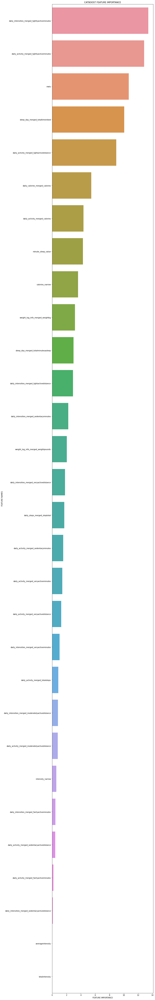

In [51]:
cat_plot = plot_feature_importance(cat.get_feature_importance(),fitbit_downsizing_02.iloc[:, 3:33].columns,'CATBOOST ')

#### GBM

In [33]:
##Declare Model

In [52]:
gbm = GradientBoostingRegressor(random_state=42)

In [22]:
##Execute Model

In [53]:
gc.collect()
gbm.fit(X_train, Y_train)
gc.collect()

0

In [34]:
##Use model to predict X_test

In [54]:
gbm_pred = gbm.predict(X_test)

In [35]:
##Calculate Model Score

In [55]:
gbm.score(X_test,Y_test)

0.22187383066991984

In [36]:
##Show Features Importances's Model

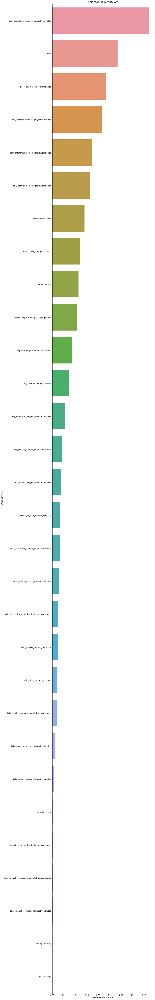

In [56]:
gbm_plot = plot_feature_importance(gbm.feature_importances_,fitbit_downsizing_02.iloc[:, 3:33].columns,'GBM ')

#### Summary Downsizing One Feature

In [57]:
ebm_plot = ebm.explain_global(name='EBM FEATURE IMPORTANCE')
show(ebm_plot)

<!-- http://127.0.0.1:7001/2641481754368/ -->

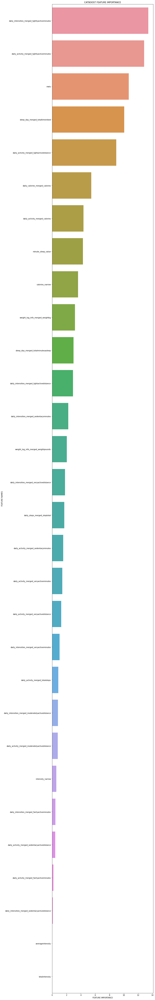

In [58]:
cat_plot = plot_feature_importance(cat.get_feature_importance(),fitbit_downsizing_02.iloc[:, 3:33].columns,'CATBOOST ')

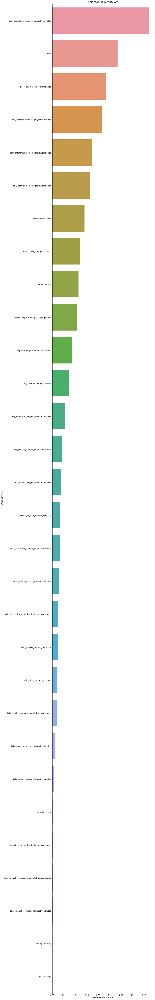

In [59]:
gbm_plot = plot_feature_importance(gbm.feature_importances_,fitbit_downsizing_02.iloc[:, 3:33].columns,'GBM ')

### 08.03 - Starting Model Train with Downsizing two features
Choice two most important feature and delete zero values

In [37]:
## Load dataset

In [60]:
fitbit_feature_selection.shape

(2494966, 33)

In [38]:
##Delete rows there was zero value in sleep_day_merged_totaltimeinbed and mets

In [83]:
fitbit_feature_down = fitbit_feature_selection.loc[fitbit_feature_selection['sleep_day_merged_totaltimeinbed']!= 0]

In [85]:
fitbit_feature_down = fitbit_feature_down.loc[fitbit_feature_down['mets']!= 0]

In [86]:
fitbit_feature_down.shape

(144017, 33)

In [39]:
##Export downsizing dataset in parquet file

In [87]:
fitbit_feature_down.to_parquet("fitbit_downsizing.parquet")

In [37]:
##Load dataset

In [9]:
gc.collect()
fitbit_downsizing = pd.read_parquet("fitbit_downsizing.parquet", engine='pyarrow')
gc.collect()

0

In [32]:
##Split data in Train & Test

In [10]:
X_train, X_test, Y_train, Y_test = train_test_split(fitbit_downsizing.values[:,3:33], 
                                                    fitbit_downsizing.values[:,2], 
                                                    test_size=0.33, 
                                                    random_state=42)
gc.collect()

0

#### EBM

In [33]:
##Declare Model

In [11]:
ebm = ExplainableBoostingRegressor(feature_names=fitbit_downsizing.iloc[:, 3:33].columns, random_state=42)

In [12]:
##Execute Model

In [13]:
gc.collect()
ebm.fit(X_train, Y_train)
gc.collect()

0

In [14]:
##Use model to predict X_test

In [15]:
ebm_pred = ebm.predict(X_test)

In [16]:
##Calculate Model Score

In [17]:
ebm.score(X_test,Y_test)

0.8449720473377687

In [18]:
##Show Features Importances's Model

In [19]:
ebm_plot = ebm.explain_global(name='EBM FEATURE IMPORTANCE')
show(ebm_plot)

<!-- http://127.0.0.1:7001/2354019442400/ -->

#### Catboost

In [20]:
##Declare Model

In [21]:
cat = CatBoostRegressor(loss_function='RMSE')

In [22]:
##Execute Model

In [23]:
gc.collect()
cat.fit(X_train, Y_train)
gc.collect()

Learning rate set to 0.088032
0:	learn: 14.5053406	total: 189ms	remaining: 3m 9s
1:	learn: 13.6873193	total: 215ms	remaining: 1m 47s
2:	learn: 12.9555991	total: 235ms	remaining: 1m 17s
3:	learn: 12.3207234	total: 254ms	remaining: 1m 3s
4:	learn: 11.7461943	total: 272ms	remaining: 54.2s
5:	learn: 11.2398100	total: 293ms	remaining: 48.6s
6:	learn: 10.7976797	total: 312ms	remaining: 44.3s
7:	learn: 10.3924869	total: 331ms	remaining: 41.1s
8:	learn: 10.0345784	total: 350ms	remaining: 38.5s
9:	learn: 9.7258157	total: 368ms	remaining: 36.5s
10:	learn: 9.4288006	total: 394ms	remaining: 35.4s
11:	learn: 9.1777803	total: 419ms	remaining: 34.5s
12:	learn: 8.9612156	total: 438ms	remaining: 33.3s
13:	learn: 8.7722660	total: 458ms	remaining: 32.3s
14:	learn: 8.5882804	total: 481ms	remaining: 31.6s
15:	learn: 8.4353560	total: 500ms	remaining: 30.8s
16:	learn: 8.2883843	total: 519ms	remaining: 30s
17:	learn: 8.1524993	total: 539ms	remaining: 29.4s
18:	learn: 8.0439203	total: 558ms	remaining: 28.8s
19

162:	learn: 6.0651026	total: 3.59s	remaining: 18.4s
163:	learn: 6.0627048	total: 3.61s	remaining: 18.4s
164:	learn: 6.0609502	total: 3.63s	remaining: 18.4s
165:	learn: 6.0593139	total: 3.65s	remaining: 18.3s
166:	learn: 6.0566850	total: 3.67s	remaining: 18.3s
167:	learn: 6.0541391	total: 3.7s	remaining: 18.3s
168:	learn: 6.0525756	total: 3.72s	remaining: 18.3s
169:	learn: 6.0508513	total: 3.73s	remaining: 18.2s
170:	learn: 6.0483976	total: 3.75s	remaining: 18.2s
171:	learn: 6.0459763	total: 3.78s	remaining: 18.2s
172:	learn: 6.0438411	total: 3.8s	remaining: 18.2s
173:	learn: 6.0424358	total: 3.82s	remaining: 18.1s
174:	learn: 6.0405466	total: 3.83s	remaining: 18.1s
175:	learn: 6.0377172	total: 3.85s	remaining: 18s
176:	learn: 6.0357436	total: 3.87s	remaining: 18s
177:	learn: 6.0340375	total: 3.9s	remaining: 18s
178:	learn: 6.0321198	total: 3.92s	remaining: 18s
179:	learn: 6.0300736	total: 3.93s	remaining: 17.9s
180:	learn: 6.0274592	total: 3.96s	remaining: 17.9s
181:	learn: 6.0254743	t

330:	learn: 5.8701960	total: 6.97s	remaining: 14.1s
331:	learn: 5.8698740	total: 6.99s	remaining: 14.1s
332:	learn: 5.8690922	total: 7.01s	remaining: 14s
333:	learn: 5.8688291	total: 7.03s	remaining: 14s
334:	learn: 5.8681202	total: 7.04s	remaining: 14s
335:	learn: 5.8674609	total: 7.06s	remaining: 14s
336:	learn: 5.8666261	total: 7.08s	remaining: 13.9s
337:	learn: 5.8660042	total: 7.1s	remaining: 13.9s
338:	learn: 5.8654131	total: 7.12s	remaining: 13.9s
339:	learn: 5.8643268	total: 7.14s	remaining: 13.9s
340:	learn: 5.8643084	total: 7.16s	remaining: 13.8s
341:	learn: 5.8639041	total: 7.18s	remaining: 13.8s
342:	learn: 5.8635754	total: 7.19s	remaining: 13.8s
343:	learn: 5.8626605	total: 7.21s	remaining: 13.8s
344:	learn: 5.8617730	total: 7.23s	remaining: 13.7s
345:	learn: 5.8609211	total: 7.24s	remaining: 13.7s
346:	learn: 5.8608603	total: 7.26s	remaining: 13.7s
347:	learn: 5.8602135	total: 7.28s	remaining: 13.6s
348:	learn: 5.8598070	total: 7.29s	remaining: 13.6s
349:	learn: 5.8591700

490:	learn: 5.7895661	total: 9.97s	remaining: 10.3s
491:	learn: 5.7890765	total: 9.99s	remaining: 10.3s
492:	learn: 5.7887208	total: 10s	remaining: 10.3s
493:	learn: 5.7885231	total: 10s	remaining: 10.3s
494:	learn: 5.7884022	total: 10s	remaining: 10.2s
495:	learn: 5.7880460	total: 10.1s	remaining: 10.2s
496:	learn: 5.7876240	total: 10.1s	remaining: 10.2s
497:	learn: 5.7874026	total: 10.1s	remaining: 10.2s
498:	learn: 5.7870783	total: 10.1s	remaining: 10.1s
499:	learn: 5.7869394	total: 10.1s	remaining: 10.1s
500:	learn: 5.7866005	total: 10.1s	remaining: 10.1s
501:	learn: 5.7861062	total: 10.2s	remaining: 10.1s
502:	learn: 5.7855984	total: 10.2s	remaining: 10.1s
503:	learn: 5.7851366	total: 10.2s	remaining: 10s
504:	learn: 5.7849769	total: 10.2s	remaining: 10s
505:	learn: 5.7845873	total: 10.2s	remaining: 9.99s
506:	learn: 5.7842240	total: 10.3s	remaining: 9.97s
507:	learn: 5.7833333	total: 10.3s	remaining: 9.94s
508:	learn: 5.7830456	total: 10.3s	remaining: 9.92s
509:	learn: 5.7827330	

658:	learn: 5.7356348	total: 13.1s	remaining: 6.77s
659:	learn: 5.7353635	total: 13.1s	remaining: 6.75s
660:	learn: 5.7350058	total: 13.1s	remaining: 6.73s
661:	learn: 5.7348167	total: 13.1s	remaining: 6.71s
662:	learn: 5.7343994	total: 13.2s	remaining: 6.69s
663:	learn: 5.7341332	total: 13.2s	remaining: 6.67s
664:	learn: 5.7340562	total: 13.2s	remaining: 6.64s
665:	learn: 5.7339026	total: 13.2s	remaining: 6.62s
666:	learn: 5.7335024	total: 13.2s	remaining: 6.6s
667:	learn: 5.7332897	total: 13.2s	remaining: 6.58s
668:	learn: 5.7332365	total: 13.3s	remaining: 6.56s
669:	learn: 5.7328027	total: 13.3s	remaining: 6.54s
670:	learn: 5.7326707	total: 13.3s	remaining: 6.52s
671:	learn: 5.7321854	total: 13.3s	remaining: 6.5s
672:	learn: 5.7319923	total: 13.3s	remaining: 6.48s
673:	learn: 5.7316078	total: 13.4s	remaining: 6.46s
674:	learn: 5.7315018	total: 13.4s	remaining: 6.44s
675:	learn: 5.7311187	total: 13.4s	remaining: 6.42s
676:	learn: 5.7308396	total: 13.4s	remaining: 6.4s
677:	learn: 5.7

819:	learn: 5.6964197	total: 16s	remaining: 3.52s
820:	learn: 5.6960180	total: 16.1s	remaining: 3.5s
821:	learn: 5.6957255	total: 16.1s	remaining: 3.48s
822:	learn: 5.6957052	total: 16.1s	remaining: 3.46s
823:	learn: 5.6953990	total: 16.1s	remaining: 3.44s
824:	learn: 5.6951907	total: 16.1s	remaining: 3.42s
825:	learn: 5.6949873	total: 16.2s	remaining: 3.4s
826:	learn: 5.6948131	total: 16.2s	remaining: 3.38s
827:	learn: 5.6946229	total: 16.2s	remaining: 3.36s
828:	learn: 5.6944769	total: 16.2s	remaining: 3.34s
829:	learn: 5.6942699	total: 16.2s	remaining: 3.32s
830:	learn: 5.6940189	total: 16.3s	remaining: 3.31s
831:	learn: 5.6937548	total: 16.3s	remaining: 3.29s
832:	learn: 5.6936245	total: 16.3s	remaining: 3.27s
833:	learn: 5.6935219	total: 16.3s	remaining: 3.25s
834:	learn: 5.6933837	total: 16.3s	remaining: 3.22s
835:	learn: 5.6931614	total: 16.3s	remaining: 3.2s
836:	learn: 5.6930785	total: 16.4s	remaining: 3.18s
837:	learn: 5.6929069	total: 16.4s	remaining: 3.16s
838:	learn: 5.692

983:	learn: 5.6676349	total: 19s	remaining: 309ms
984:	learn: 5.6675971	total: 19s	remaining: 289ms
985:	learn: 5.6674491	total: 19s	remaining: 270ms
986:	learn: 5.6670913	total: 19s	remaining: 251ms
987:	learn: 5.6669608	total: 19.1s	remaining: 232ms
988:	learn: 5.6668157	total: 19.1s	remaining: 212ms
989:	learn: 5.6665471	total: 19.1s	remaining: 193ms
990:	learn: 5.6664790	total: 19.1s	remaining: 174ms
991:	learn: 5.6663943	total: 19.1s	remaining: 154ms
992:	learn: 5.6662875	total: 19.1s	remaining: 135ms
993:	learn: 5.6661932	total: 19.2s	remaining: 116ms
994:	learn: 5.6661334	total: 19.2s	remaining: 96.4ms
995:	learn: 5.6661054	total: 19.2s	remaining: 77.1ms
996:	learn: 5.6659959	total: 19.2s	remaining: 57.8ms
997:	learn: 5.6657027	total: 19.2s	remaining: 38.5ms
998:	learn: 5.6655818	total: 19.3s	remaining: 19.3ms
999:	learn: 5.6653481	total: 19.3s	remaining: 0us


0

In [24]:
##Use model to predict X_test

In [25]:
cat_pred = cat.predict(X_test)

In [26]:
##Calculate Model Score

In [27]:
cat.score(X_test, Y_test)

0.8559638475544102

In [28]:
##Show Features Importances's Model

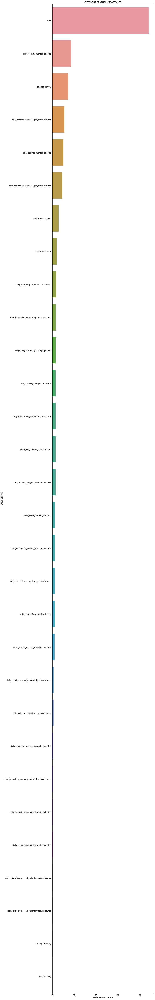

In [29]:
cat_plot = plot_feature_importance(cat.get_feature_importance(),fitbit_downsizing.iloc[:, 3:33].columns,'CATBOOST ')

#### GBM

In [30]:
##Declare Model

In [31]:
gbm = GradientBoostingRegressor(random_state=42)

In [32]:
##Execute Model

In [33]:
gc.collect()
gbm.fit(X_train, Y_train)
gc.collect()

0

In [34]:
##Use model to predict X_test

In [35]:
gbm_pred = gbm.predict(X_test)

In [36]:
##Calculate Model Score

In [37]:
gbm.score(X_test,Y_test)

0.8191447849411101

In [38]:
##Show Features Importances's Model

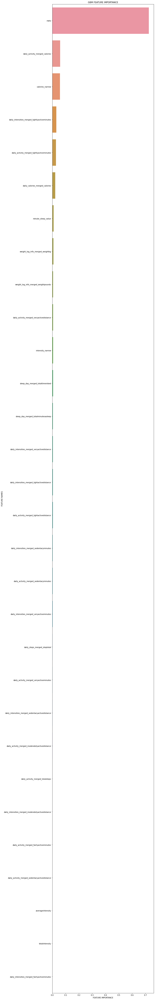

In [39]:
gbm_plot = plot_feature_importance(gbm.feature_importances_,fitbit_downsizing.iloc[:, 3:33].columns,'GBM ')

#### Summary Downsizing Two features

In [40]:
ebm_plot = ebm.explain_global(name='EBM FEATURE IMPORTANCE')
show(ebm_plot)

<!-- http://127.0.0.1:7001/2354048057152/ -->

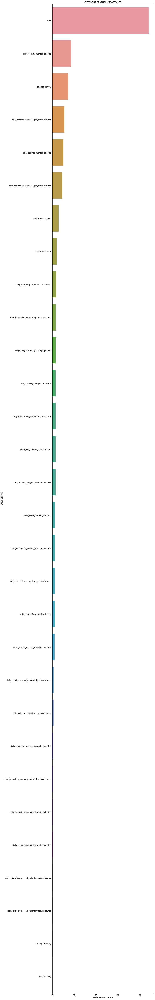

In [41]:
cat_plot = plot_feature_importance(cat.get_feature_importance(),fitbit_downsizing.iloc[:, 3:33].columns,'CATBOOST ')

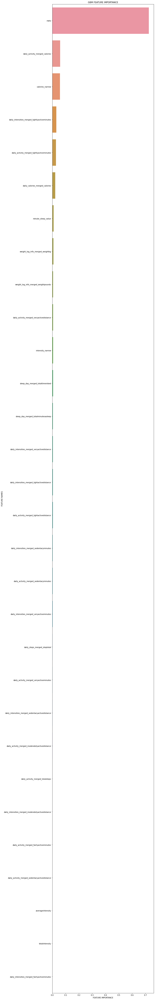

In [42]:
gbm_plot = plot_feature_importance(gbm.feature_importances_,fitbit_downsizing.iloc[:, 3:33].columns,'GBM ')

### 08.04 - Sumarry Model Results with Full dataset & Downsizing

In [60]:
score_model = pd.read_csv('score_models.csv')

In [61]:
pd.set_option('display.max_columns', 10)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', '{:.4}'.format)
score_model

,dataset,ebm,catboost,gbm
0,"full(2,49M)",0.2668,0.2706,0.2369
1,downsizing 50% (1.63M),0.2365,0.2403,0.2219
2,downsizing 95% (144K),0.845,0.856,0.8191


## 08-Interpretability

In [43]:
shap.initjs()

#### EBM

In [84]:
explainer_ebm = shap.Explainer(ebm, feature_names=fitbit_downsizing.iloc[:, 3:33].columns)

Exception: The passed model is not callable and cannot be analyzed directly with the given masker! Model: ExplainableBoostingRegressor(feature_names=['sleep_day_merged_totaltimeinbed',
                                            'daily_intensities_merged_lightlyactiveminutes',
                                            'daily_activity_merged_lightlyactiveminutes',
                                            'sleep_day_merged_totalminutesasleep',
                                            'daily_activity_merged_veryactiveminutes',
                                            'daily_calories_merged_calories',
                                            'daily_activity_merged_calories',
                                            'daily_intensities_merged_veryact...
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous',
                                            'continuous', 'continuous', ...])

In [ ]:
shap_values = explainer(X_test)

In [ ]:
ind = 0
shap.plots.force(shap_values[ind])

In [ ]:
shap.summary_plot(shap_values, X_test)

#### Catboost

In [48]:
explainer_cat = shap.Explainer(cat, feature_names=fitbit_downsizing.iloc[:, 3:33].columns)

In [49]:
shap_values_cat = explainer_cat(X_test)

In [50]:
explainer_cat_tre = shap.TreeExplainer(cat, feature_names=fitbit_downsizing.iloc[:, 3:33].columns)

In [51]:
shap_values_cat_tre = explainer_cat_tre.shap_values(X_test)

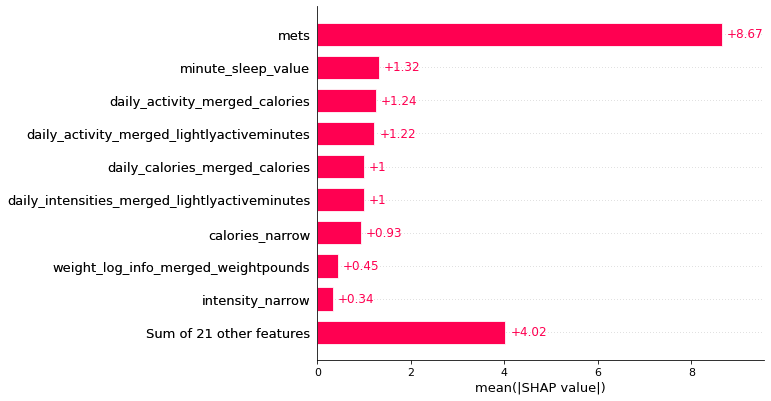

In [52]:
shap.plots.bar(shap_values_cat)

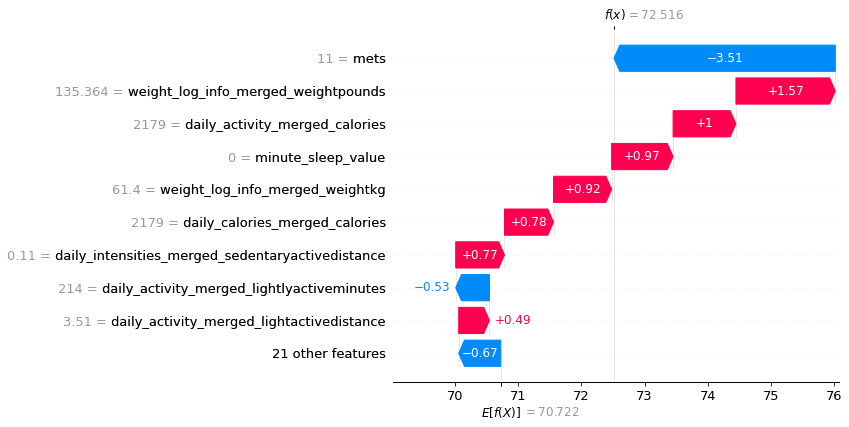

In [53]:
shap.plots.waterfall(shap_values_cat[0])

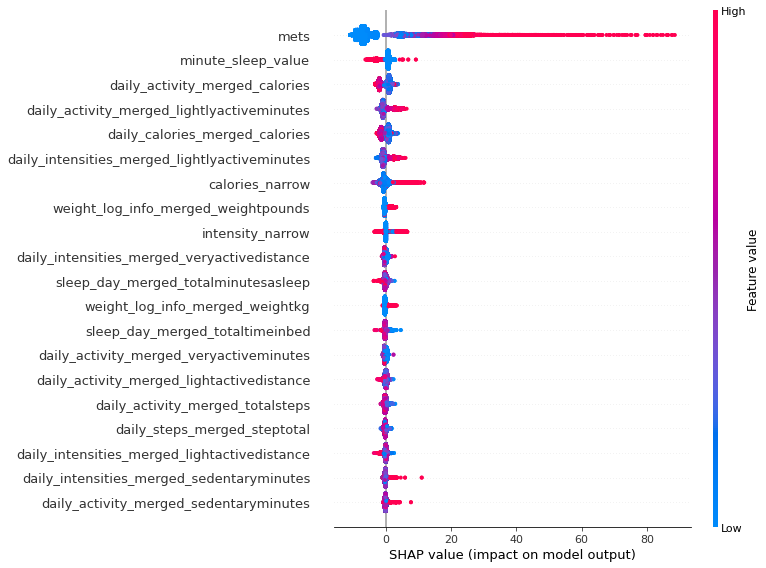

In [54]:
shap.summary_plot(shap_values_cat, X_test)

In [55]:
shap.plots.force(shap_values_cat[0])

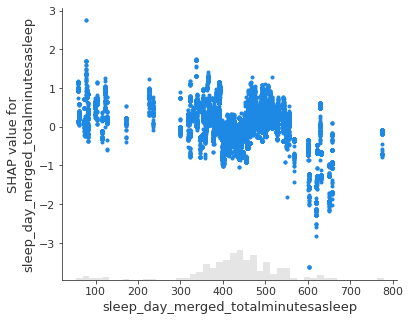

In [64]:
shap.plots.scatter(shap_values_cat[:,"sleep_day_merged_totalminutesasleep"])

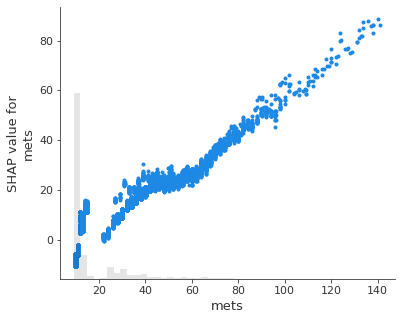

In [71]:
shap.plots.scatter(shap_values_cat[:,"mets"])

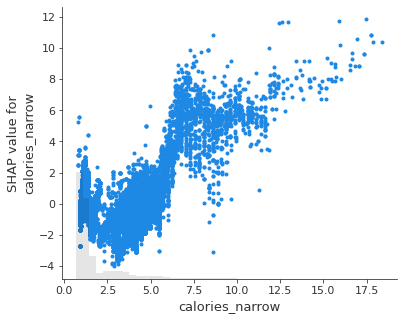

In [73]:
shap.plots.scatter(shap_values_cat[:,"calories_narrow"])

#### GBM

In [74]:
explainer_gbm = shap.Explainer(gbm, feature_names=fitbit_downsizing.iloc[:, 3:33].columns)

In [75]:
shap_values_gbm = explainer_gbm(X_test)

In [76]:
explainer_gbm_tre = shap.TreeExplainer(gbm, feature_names=fitbit_downsizing.iloc[:, 3:33].columns)

In [77]:
shap_values_gbm_tre = explainer_gbm_tre.shap_values(X_test)

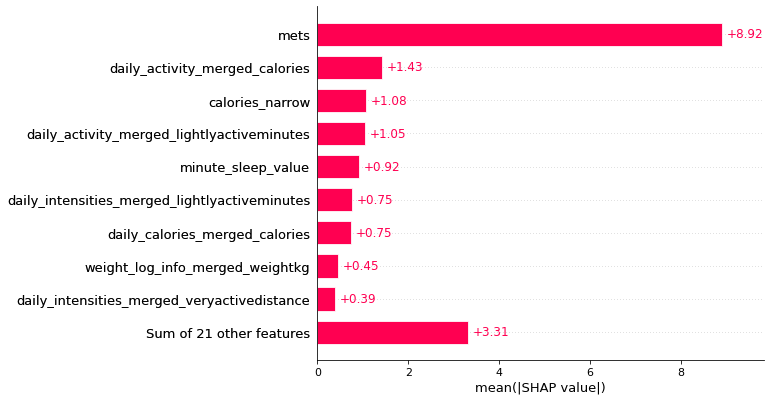

In [79]:
shap.plots.bar(shap_values_gbm)

In [80]:
shap.plots.waterfall(shap_values_gbm[0])

Exception: waterfall_plot requires a scalar base_values of the model output as the first parameter, but you have passed an array as the first parameter! Try shap.waterfall_plot(explainer.base_values[0], values[0], X[0]) or for multi-output models try shap.waterfall_plot(explainer.base_values[0], values[0][0], X[0]).

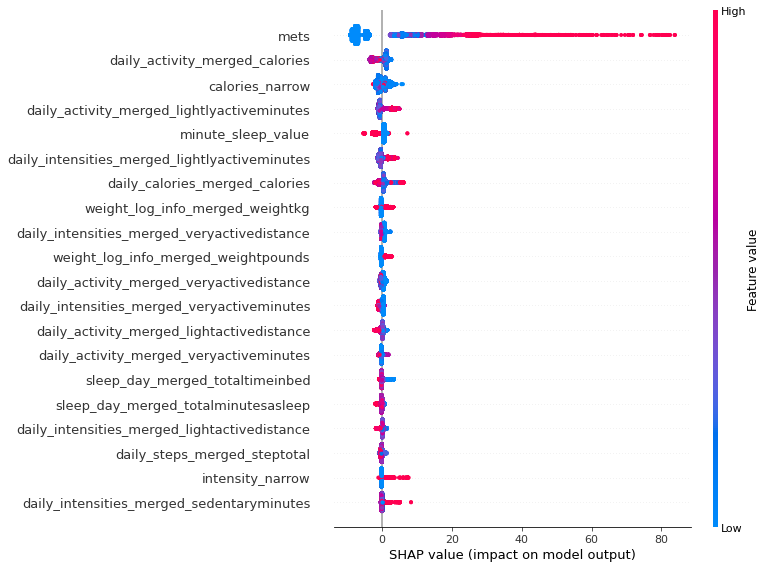

In [81]:
shap.summary_plot(shap_values_gbm, X_test)

In [82]:
shap.plots.force(shap_values_gbm[0])

In [85]:
shap.plots.scatter(shap_values_gbm["sleep_day_merged_totalminutesasleep"])

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [86]:
shap.plots.scatter(shap_values_gbm[:,"mets"], color=shap_values_gbm)

IndexError: index 16 is out of bounds for axis 1 with size 1

In [87]:
shap.plots.scatter(shap_values_gbm[:,"calories_narrow"])

IndexError: index 28 is out of bounds for axis 1 with size 1